In [6]:
session_paths = [
    "/data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_31/2social_mini_20240819V1r1_femalebleach_11_48/",
    "/data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_31/2social_mini_20240819V1r1_single_11_29/",
    "/data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240819V1r1_AO_single_14_30/",
]


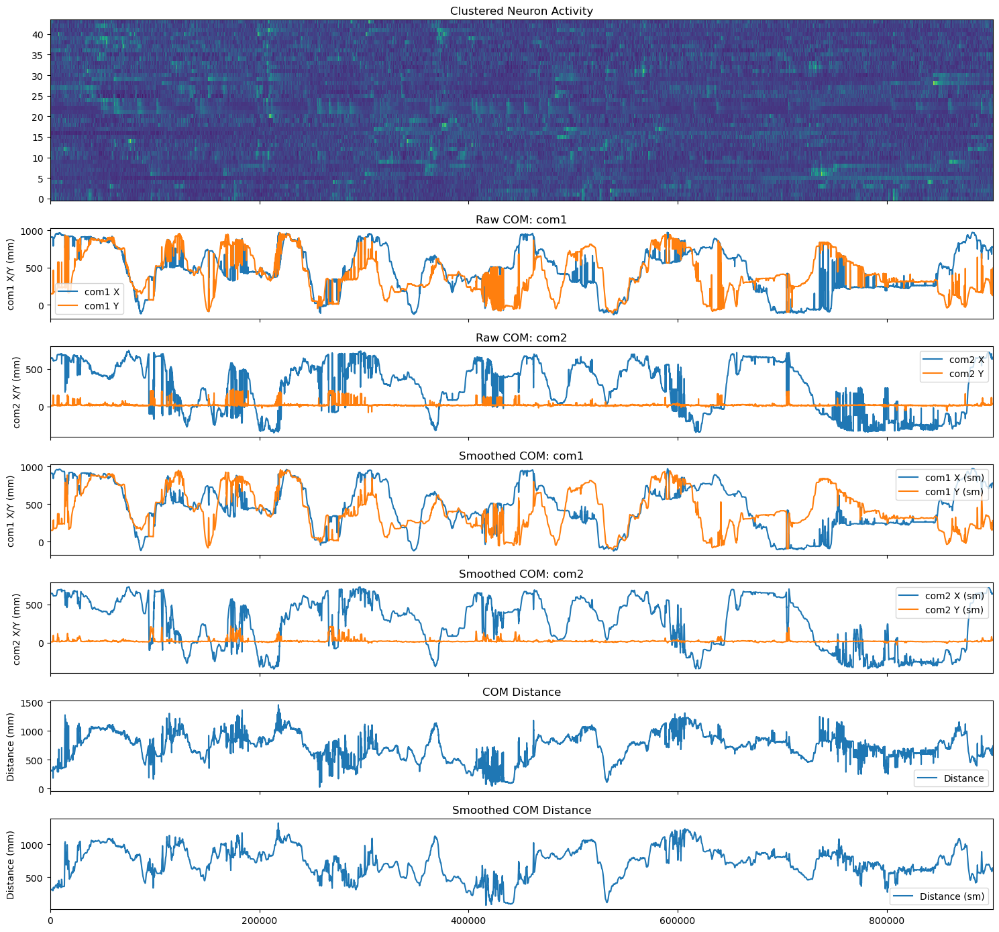

session plot saved at: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_31/2social_mini_20240819V1r1_femalebleach_11_48/MIR_Aligned


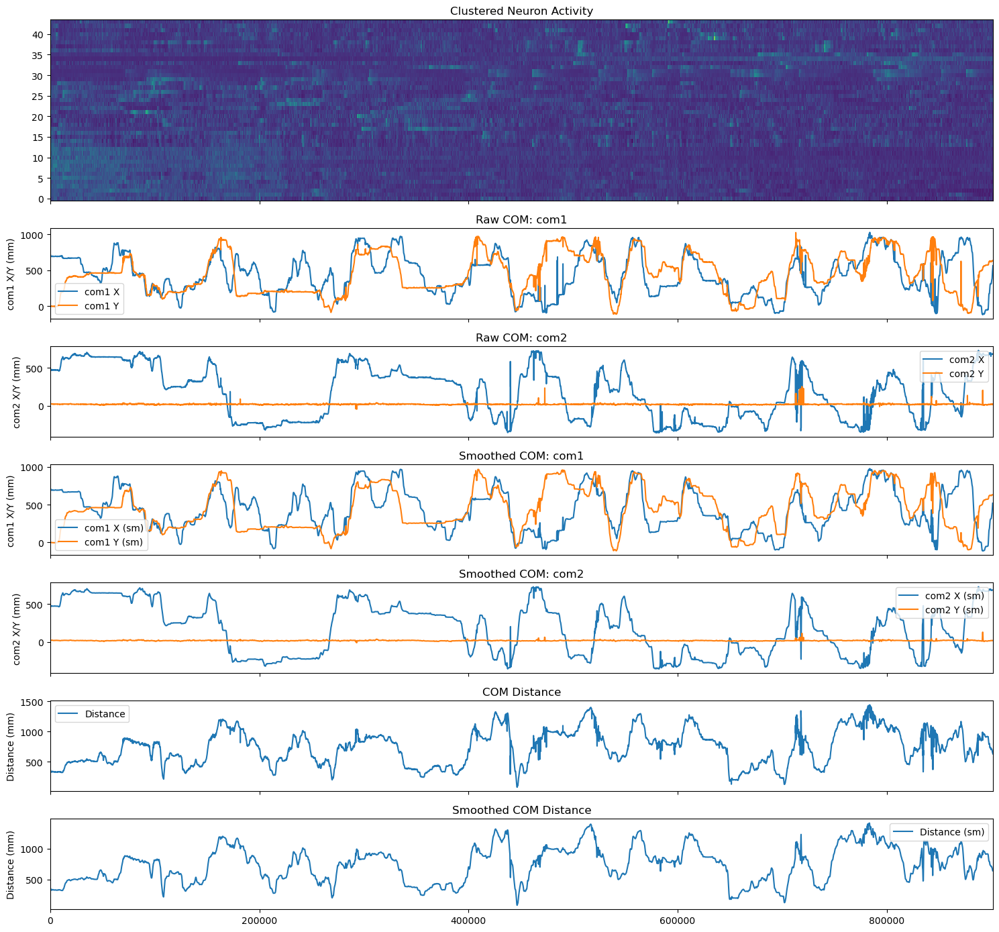

session plot saved at: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_31/2social_mini_20240819V1r1_single_11_29/MIR_Aligned


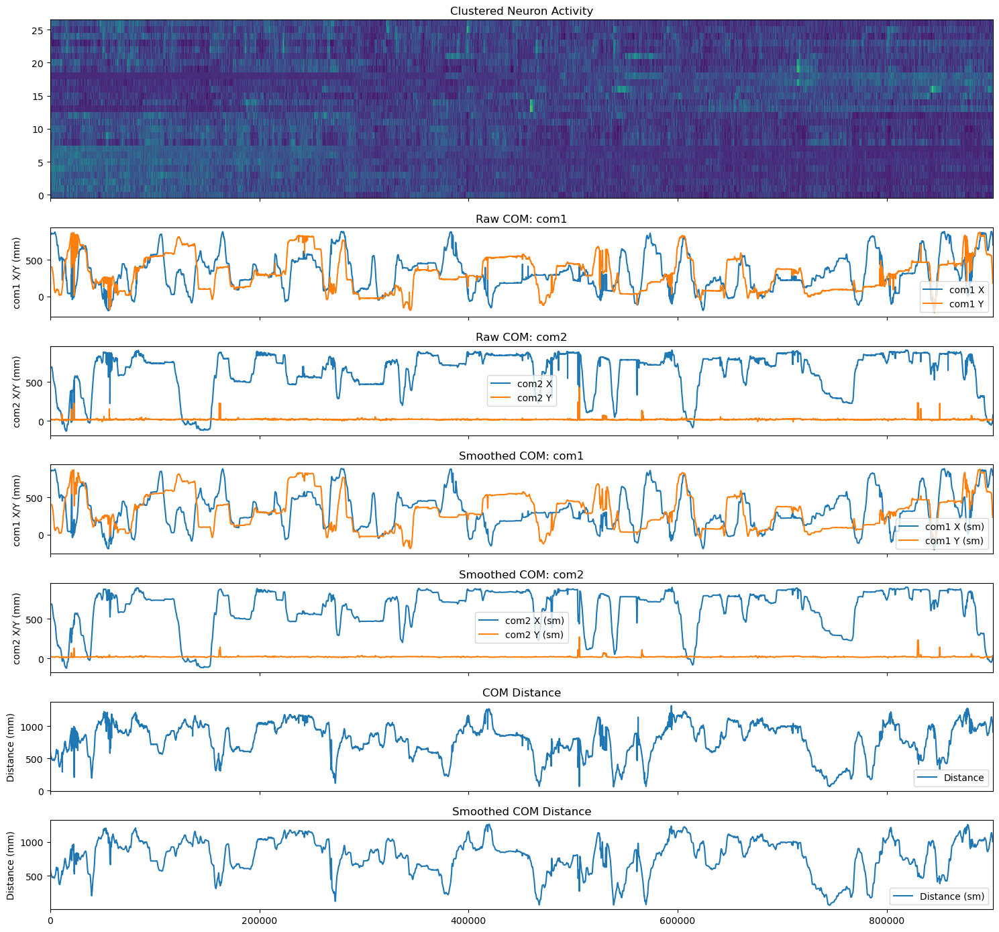

session plot saved at: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240819V1r1_AO_single_14_30/MIR_Aligned


In [63]:
import os
import json
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, leaves_list
from scipy.stats import zscore

# ----------------------------------------------------------------------------
# 1. Load exclusion mapping
# ----------------------------------------------------------------------------
exclude_json_path = '/home/lq53/mir_repos/BBOP/random_tests/25feb_more_corr_explo/neuro_exclude.json'
with open(exclude_json_path, 'r') as f:
    exclude_dict = json.load(f)

def get_excluded_neurons_for_session(session_path, exclude_dict):
    if session_path in exclude_dict:
        return exclude_dict[session_path]
    for key, val in exclude_dict.items():
        if key in session_path:
            return val
    return []

# ----------------------------------------------------------------------------
# 2. Load session HDF5
# ----------------------------------------------------------------------------
def load_session_data(rec_path):
    h5_dir = os.path.join(rec_path, 'MIR_Aligned')
    pattern = '*aligned_predictions_with_ca_and_dF_F*.h5'
    h5_files = glob.glob(os.path.join(h5_dir, pattern))
    if not h5_files:
        raise FileNotFoundError(f"No .h5 with aligned_predictions_with_ca_and_dF_F in {h5_dir}")
    hdf5_file_path = h5_files[0]

    df = pd.read_hdf(hdf5_file_path, key='df')

    norm_path = os.path.normpath(rec_path)
    df['session_id']      = os.path.basename(norm_path)
    df['recording_date']  = os.path.basename(os.path.dirname(norm_path))
    df['experiment']      = os.path.basename(os.path.dirname(os.path.dirname(norm_path)))
    df['session_path']    = rec_path
    df['file_path']       = hdf5_file_path
    return df

# ----------------------------------------------------------------------------
# 3. Process neuron activity
# ----------------------------------------------------------------------------
def process_neuron_activity(df, exclude_dict=None, manual_exclude_indices=None, apply_exclusion=True):
    if apply_exclusion:
        if manual_exclude_indices is not None:
            excluded = manual_exclude_indices
        elif exclude_dict is not None:
            excluded = get_excluded_neurons_for_session(df['session_path'].iloc[0], exclude_dict)
        else:
            excluded = []
    else:
        excluded = []

    exclude_cols = {f'dF_F_roi{i}' for i in excluded}
    neuron_cols = [c for c in df.columns if c.startswith('dF_F_roi') and c not in exclude_cols]
    activity = df[neuron_cols].values.T
    variances = np.var(activity, axis=1)
    thresh = np.percentile(variances, 5)
    keep = variances > thresh
    filtered = activity[keep, :]
    filtered_cols = [col for i, col in enumerate(neuron_cols) if keep[i]]
    normalized = zscore(filtered, axis=1)
    return normalized, filtered_cols, df.reset_index()

# ----------------------------------------------------------------------------
# 4. Plotting with separate & smoothed COM + distance
# ----------------------------------------------------------------------------
def plot_session_data(df, exclude_dict=None, manual_exclude_indices=None, apply_exclusion=True):
    neuron_norm, neuron_cols, df_new = process_neuron_activity(
        df, exclude_dict, manual_exclude_indices, apply_exclusion
    )
    time = df_new['timestamp_ms_mini']

    # Identify com prefixes
    com_prefixes = sorted({col.split('_')[0] for col in df_new.columns if col.startswith('com')})

    # Compute smoothed COM (5-point moving average)
    com_cols = [f'{p}_{axis}' for p in com_prefixes for axis in ('x','y','z')]
    smoothed = df_new[com_cols].rolling(window=5, center=True).mean()

    # Compute distance between first two COMs
    if len(com_prefixes) >= 2:
        p1, p2 = com_prefixes[0], com_prefixes[1]
        dx = df_new[f'{p1}_x'] - df_new[f'{p2}_x']
        dy = df_new[f'{p1}_y'] - df_new[f'{p2}_y']
        dz = df_new[f'{p1}_z'] - df_new[f'{p2}_z']
        dist = np.sqrt(dx**2 + dy**2 + dz**2)
        dist_sm = dist.rolling(window=5, center=True).mean()
    else:
        dist = pd.Series([])
        dist_sm = pd.Series([])

    # Setup figure: 1 heatmap + 2 raw COM + 2 smoothed COM + 2 distance = 7 rows
    fig = plt.figure(figsize=(15, 2 * 7))
    gs = fig.add_gridspec(nrows=7, ncols=1, height_ratios=[2] + [1]*6)

    # Heatmap
    ax0 = fig.add_subplot(gs[0, 0])
    if neuron_norm.size:
        Z = linkage(neuron_norm, method='ward')
        order = leaves_list(Z)
        data = neuron_norm[order, :]
        ax0.pcolormesh(time, np.arange(data.shape[0]), data, cmap='viridis', shading='auto')
        ax0.set_title('Clustered Neuron Activity')
    else:
        ax0.text(0.5, 0.5, 'No neuron data', transform=ax0.transAxes, ha='center')
        ax0.set_title('No Neuron Activity')
    ax0.tick_params(labelbottom=False)

    # Raw COM per animal
    for i, pref in enumerate(com_prefixes[:2], start=1):
        ax = fig.add_subplot(gs[i, 0], sharex=ax0)
        ax.plot(time, df_new[f'{pref}_x'], label=f'{pref} X')
        ax.plot(time, df_new[f'{pref}_y'], label=f'{pref} Y')
        ax.set_ylabel(f'{pref} X/Y (mm)')
        ax.set_title(f'Raw COM: {pref}')
        ax.legend()
        ax.tick_params(labelbottom=False)

    # Smoothed COM per animal
    for j, pref in enumerate(com_prefixes[:2], start=3):
        ax = fig.add_subplot(gs[j, 0], sharex=ax0)
        ax.plot(time, smoothed[f'{pref}_x'], label=f'{pref} X (sm)')
        ax.plot(time, smoothed[f'{pref}_y'], label=f'{pref} Y (sm)')
        ax.set_ylabel(f'{pref} X/Y (mm)')
        ax.set_title(f'Smoothed COM: {pref}')
        ax.legend()
        ax.tick_params(labelbottom=False)

    # Distance raw
    ax5 = fig.add_subplot(gs[5, 0], sharex=ax0)
    ax5.plot(time, dist, label='Distance')
    ax5.set_ylabel('Distance (mm)')
    ax5.set_title('COM Distance')
    ax5.legend()
    ax5.tick_params(labelbottom=False)

    # Distance smoothed
    ax6 = fig.add_subplot(gs[6, 0], sharex=ax0)
    ax6.plot(time, dist_sm, label='Distance (sm)')
    ax6.set_ylabel('Distance (mm)')
    ax6.set_title('Smoothed COM Distance')
    ax6.legend()

    plt.tight_layout()
    plt.show()
    # save figure into MIR_Aligned
    save_dir       = os.path.join(df_new['session_path'].iloc[0], 'MIR_Aligned')
    session_name   = os.path.basename(os.path.normpath(df_new['session_path'].iloc[0]))
    pred_name      = os.path.splitext(os.path.basename(df_new['file_path'].iloc[0]))[0]
    output_filename = f"session_plot_{session_name}_{pred_name}.png"
    fig.savefig(os.path.join(save_dir, output_filename), dpi=300)
    print(f"session plot saved at: {save_dir}")


# ------------------------------------------------------------------------------
# 5. Example Usage
# ------------------------------------------------------------------------------


# Plot with exclusion
# for path in session_paths:
#     df_s = load_session_data(path)
#     plot_session_data(df_s, exclude_dict=exclude_dict, apply_exclusion=True)

# Plot all neurons
for path in session_paths:
    df_s = load_session_data(path)
    plot_session_data(df_s, apply_exclusion=False)


Saved giant plot to giant_combined_session_plot.png


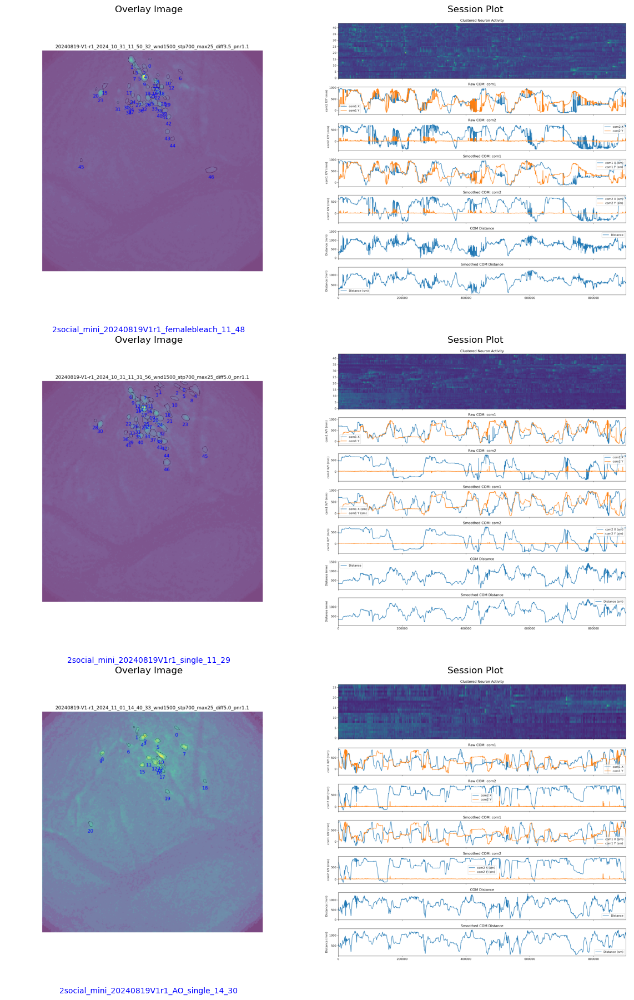

In [ ]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

def get_image_by_prefix(directory, prefix):
    """
    Return the first file in directory that starts with prefix and has a .png extension.
    If there are more than one, print a warning.
    
    Args:
        directory (str): Directory path where to search.
        prefix (str): File name prefix to look for.
        
    Returns:
        selected_file (str or None): The selected file path, or None if none found.
        file_list (list): List of all matching files.
    """
    pattern = os.path.join(directory, f"{prefix}*.png")
    files = glob.glob(pattern)
    
    if not files:
        return None, []
    if len(files) > 1:
        print(f"Warning: Found multiple files starting with '{prefix}' in {directory} Files: {files}")
    return files[0], files

def plot_combined_session_images_from_csv(csv_file,
                                            include_filter=None,
                                            exclude_filter=None,
                                            output_file='giant_plot.png'):
    """
    Reads session paths from a CSV file (with a column named 'path'), then for each session:
      - Navigates to its 'MIR_Aligned' subdirectory.
      - Searches for an overlay image (filename starting with 'overlay') 
        and a session plot image (filename starting with 'session_plot').
      - If multiple overlay images are found, the code attempts to disambiguate by locating
        the corresponding predictions file (with a .h5 or .nc extension) whose name contains a signature.
        That signature (everything after the last 'F_' in the predictions file) is used to select 
        the correct overlay.
      - If both images are successfully loaded, they are saved for later plotting.
    
    Finally, plots each valid session pair on a separate row and saves the resulting figure.
    """
    
    # Load session paths from the CSV file.
    try:
        df = pd.read_csv(csv_file)
    except Exception as e:
        print(f"Error reading CSV file {csv_file}: {e}")
        return
    
    if 'path' not in df.columns:
        print("CSV does not contain a 'path' column.")
        return
    
    session_paths = df['path'].tolist()
    valid_session_pairs = []  # List of tuples: (overlay_img, session_plot_img)
    valid_session_paths = []  # For annotations
    
    for sp in session_paths:
        # Apply include filtering: all keywords in include_filter must be in the path.
        if include_filter and not all(keyword in sp for keyword in include_filter):
            continue
        
        # Apply exclude filtering: if any keyword in exclude_filter is found in the path, skip.
        if exclude_filter and any(keyword in sp for keyword in exclude_filter):
            continue
        
        # Construct the directory path where images are stored.
        align_dir = os.path.join(sp, "MIR_Aligned")
        if not os.path.exists(align_dir):
            print(f"Directory not found: {align_dir} Skipping session: {sp}")
            continue

        # Get overlay image(s) (files starting with "overlay").
        overlay_file, overlays = get_image_by_prefix(align_dir, "overlay")
        
        # If there are multiple overlays, try to disambiguate using the predictions file.
        if overlays and len(overlays) > 1:
            # Search for predictions files with .h5 or .nc extension.
            preds = glob.glob(os.path.join(align_dir, "aligned_predictions*.[hH]5")) + \
                    glob.glob(os.path.join(align_dir, "aligned_predictions*.[nN]c"))
            if preds:
                # If there are multiple prediction files, try to use the one that does not contain 'default'
                if len(preds) > 1:
                    non_default = [p for p in preds if "default" not in p.lower()]
                    predictions_file = non_default[0] if non_default else preds[0]
                else:
                    predictions_file = preds[0]
                basename = os.path.basename(predictions_file)
                
                # Use rsplit to correctly extract the signature (text after the last "F_" until the extension).
                if "F_" in basename:
                    signature = basename.rsplit("F_", 1)[1].rsplit('.', 1)[0]
                    candidate = None
                    # Iterate through overlay candidates and select the one with an exact signature match.
                    for f in overlays:
                        base_overlay = os.path.basename(f)
                        if base_overlay.startswith("overlay_") and base_overlay.endswith(".png"):
                            candidate_sig = base_overlay[len("overlay_"):-len(".png")]
                            if candidate_sig == signature:
                                candidate = f
                                break
                    if candidate:
                        overlay_file = candidate
                    else:
                        print(f"Warning: No overlay file exactly matches the signature '{signature}' from predictions file '{basename}'. Using the first overlay candidate.")
                else:
                    print(f"Warning: Predictions file '{basename}' does not contain expected 'F_' marker. Using the first overlay candidate.")
        
        # Get session plot image (file name starting with "session_plot").
        session_plot_file, session_plots = get_image_by_prefix(align_dir, "session_plot")
        
        if overlay_file and session_plot_file:
            try:
                overlay_img = Image.open(overlay_file)
                session_plot_img = Image.open(session_plot_file)
            except Exception as e:
                print(f"Error loading images in {align_dir}: {e} Skipping session: {sp}")
                continue
            
            valid_session_pairs.append((overlay_img, session_plot_img))
            valid_session_paths.append(sp)
        else:
            found_overlay = overlays if overlays else "None"
            found_session = session_plots if session_plots else "None"
            print(f"Required images not found in {align_dir}. Found overlay: {found_overlay}, session plot: {found_session}")
    
    if not valid_session_pairs:
        print("No valid session pairs were found. Nothing to plot.")
        return

    # Create the composite figure, one row per session pair.
    n_rows = len(valid_session_pairs)
    fig, axes = plt.subplots(n_rows, 2, figsize=(12, 6 * n_rows))
    
    # When there is only one row, ensure axes is a nested list.
    if n_rows == 1:
        axes = [axes]
    
    for i, ((overlay_img, session_plot_img), sp) in enumerate(zip(valid_session_pairs, valid_session_paths)):
        # Left subplot: Overlay image.
        axes[i][0].imshow(overlay_img)
        axes[i][0].axis('off')
        axes[i][0].set_title("Overlay Image")
        
        # Right subplot: Session plot image.
        axes[i][1].imshow(session_plot_img)
        axes[i][1].axis('off')
        axes[i][1].set_title("Session Plot")
        
        # Annotate each row with the session folder name.
        session_label = os.path.basename(os.path.normpath(sp))
        axes[i][0].annotate(session_label, xy=(0.5, -0.1), xycoords='axes fraction',
                            ha='center', fontsize=10, color='blue')
    
    plt.tight_layout()
    plt.savefig(output_file, dpi=300)
    print(f"Saved giant plot to {output_file}")
    plt.show()

# EXAMPLE USAGE
if __name__ == '__main__':
    csv_file = "/home/lq53/mir_repos/BBOP/random_tests/25may_social_try/socialcom_3.csv"
    # "/home/lq53/mir_repos/BBOP/random_tests/25mar_minibbop_integration/250331_sum_aligned_good_path.csv"
    
    # Set include and exclude keywords if needed.
    include_keys = []  # e.g., ["v1"]
    exclude_keys = []
    
    plot_combined_session_images_from_csv(csv_file,
                                            include_filter=include_keys,
                                            exclude_filter=exclude_keys,
                                            output_file='giant_combined_session_plot.png')


Global Pearson r = 0.035, p = 0.001


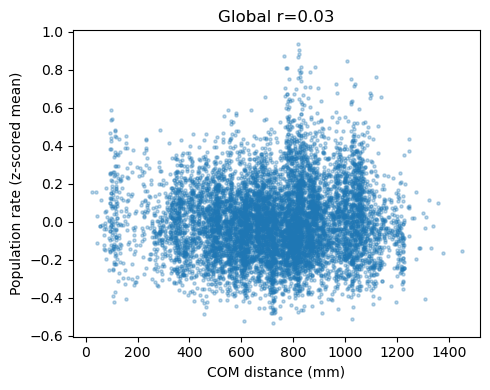

/tmp/ipykernel_92667/2373009515.py:49: RuntimeWarning: Mean of empty slice.
  mean_rate = [pop_rate[bin_idx==i].mean() for i in range(1, len(bins))]
/home/lq53/miniconda3/envs/bbop241209/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


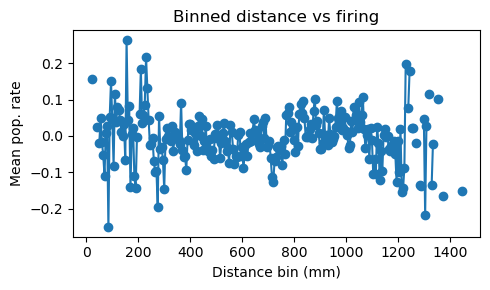

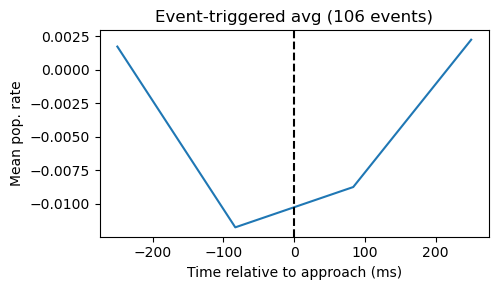

Global Pearson r = -0.165, p = 0.000


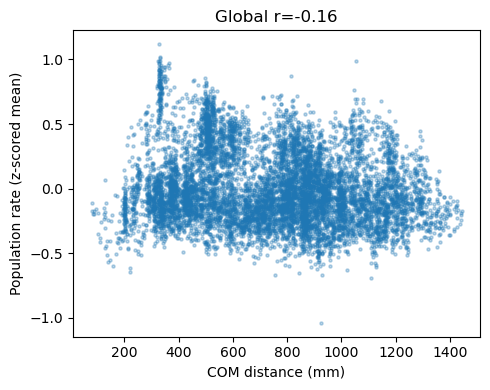

/tmp/ipykernel_92667/2373009515.py:49: RuntimeWarning: Mean of empty slice.
  mean_rate = [pop_rate[bin_idx==i].mean() for i in range(1, len(bins))]
/home/lq53/miniconda3/envs/bbop241209/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


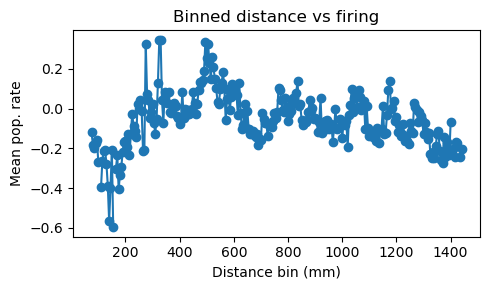

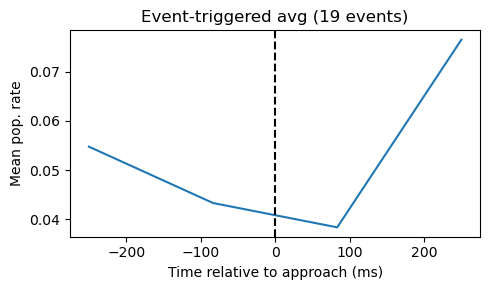

Global Pearson r = 0.028, p = 0.008


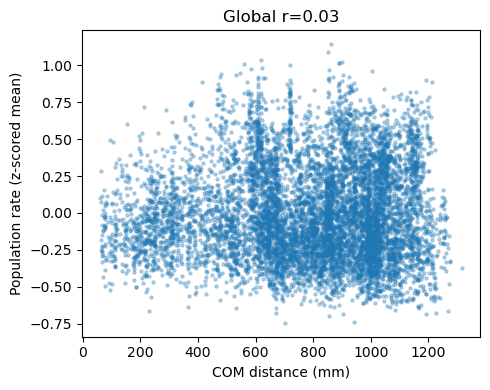

/tmp/ipykernel_92667/2373009515.py:49: RuntimeWarning: Mean of empty slice.
  mean_rate = [pop_rate[bin_idx==i].mean() for i in range(1, len(bins))]
/home/lq53/miniconda3/envs/bbop241209/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


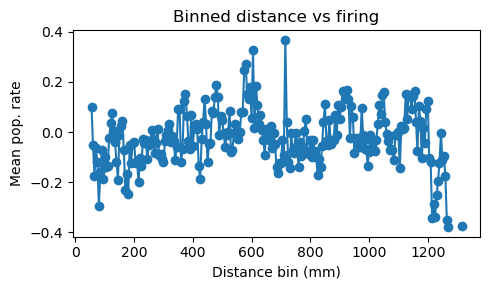

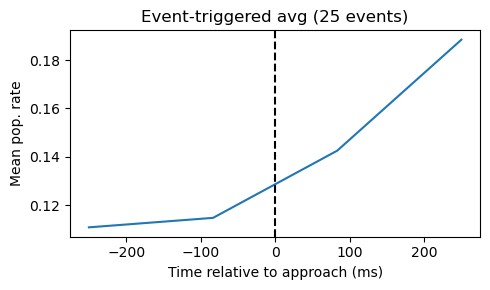

In [ ]:


import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr


def evaluate_distance_vs_activity(
    rec_path,
    exclude_dict=None,
    distance_bin_size=5.0,
    approach_pct=10,
    approach_win_ms=500
):
    # 1) load & preprocess
    df = load_session_data(rec_path)
    neuron_norm, neuron_cols, df_new = process_neuron_activity(
        df,
        exclude_dict=exclude_dict,
        apply_exclusion=True
    )
    time_ms = df_new['timestamp_ms_mini'].values
    pop_rate = neuron_norm.mean(axis=0)

    # 2) COM distance
    prefixes = sorted({c.split('_')[0] for c in df_new.columns if c.startswith('com')})
    if len(prefixes) < 2:
        raise ValueError("Need two COM streams")
    com1 = df_new[[f'{prefixes[0]}_{ax}' for ax in ('x','y','z')]].values
    com2 = df_new[[f'{prefixes[1]}_{ax}' for ax in ('x','y','z')]].values
    dist = np.linalg.norm(com2 - com1, axis=1)

    # --- 1. Global correlation ---
    r_all, p_all = pearsonr(dist, pop_rate)
    print(f"Global Pearson r = {r_all:.3f}, p = {p_all:.3f}")

    # plot
    plt.figure(figsize=(5,4))
    plt.scatter(dist, pop_rate, s=5, alpha=0.3)
    plt.xlabel("COM distance (mm)")
    plt.ylabel("Population rate (z-scored mean)")
    plt.title(f"Global r={r_all:.2f}")
    plt.tight_layout()
    plt.show()

    # --- 2. Distance-binned firing ---
    bins = np.arange(0, np.ceil(dist.max()/distance_bin_size)*distance_bin_size + 1, distance_bin_size)
    bin_idx = np.digitize(dist, bins)
    mean_rate = [pop_rate[bin_idx==i].mean() for i in range(1, len(bins))]
    plt.figure(figsize=(5,3))
    plt.plot(bins[:-1], mean_rate, marker='o')
    plt.xlabel("Distance bin (mm)")
    plt.ylabel("Mean pop. rate")
    plt.title("Binned distance vs firing")
    plt.tight_layout()
    plt.show()

    # --- 3. Event-triggered average around close approaches ---
    # threshold = the approach_pct percentile of distance
    thresh = np.percentile(dist, approach_pct)
    # find all times when dist crosses below thresh
    crossings = np.where((dist[:-1] >= thresh) & (dist[1:] < thresh))[0] + 1
    half_win = int((approach_win_ms / np.median(np.diff(time_ms))) // 2)
    epochs = []
    for idx in crossings:
        start = max(0, idx - half_win)
        end   = min(len(pop_rate), idx + half_win)
        epoch = pop_rate[start:end]
        # pad if needed
        if len(epoch) == 2*half_win:
            epochs.append(epoch)
    if epochs:
        epochs = np.vstack(epochs)
        t_window = np.linspace(-approach_win_ms/2, approach_win_ms/2, epochs.shape[1])
        mean_epoch = epochs.mean(axis=0)
        plt.figure(figsize=(5,3))
        plt.plot(t_window, mean_epoch)
        plt.axvline(0, color='k', ls='--')
        plt.xlabel("Time relative to approach (ms)")
        plt.ylabel("Mean pop. rate")
        plt.title(f"Event-triggered avg ({len(epochs)} events)")
        plt.tight_layout()
        plt.show()
    else:
        print("No approach events found at that threshold.")

# Example usage:
for path in session_paths:
    evaluate_distance_vs_activity(path, exclude_dict=exclude_dict)


In [ ]:


import os
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from scipy.optimize import least_squares


def plot_com_circle_for_path_social(
    base_path,
    pred_folder='DANNCE/predict00',
    vis_dir='COM/predict00/vis',
    filename=None
):
    """
    Load multi-animal COM (x,y,z), extract x/y for each animal,
    fit circles to each convex hull in x-y space,
    plot both COM trajectories in distinct colors,
    and save under base_path/vis/.

    Fallbacks:
      1) base_path/pred_folder/com3d_used.mat
      2) base_path/COM/predict00/com3d0.mat
    """
    # determine COM file
    primary = os.path.join(base_path, pred_folder, 'com3d_used.mat')
    fallback = os.path.join(base_path, 'COM/predict00', 'com3d0.mat')
    if os.path.isfile(primary):
        com_file = primary
    elif os.path.isfile(fallback):
        com_file = fallback
        print(f"Primary COM file not found; using fallback: {com_file}")
    else:
        raise FileNotFoundError(f"Neither {primary} nor {fallback} exists.")

    # load raw COM
    mat = sio.loadmat(com_file)
    raw = mat.get('com')
    if raw is None:
        raise KeyError(f"'com' variable not found in {com_file}")

    # reshape to (frames,2,n_animals)
    if raw.ndim == 3 and raw.shape[1] == 3:
        # already (frames,3,n); take x,y only
        com_xy = raw[:, :2, :]
    elif raw.ndim == 3 and raw.shape[1] == 2:
        # already (frames,2,n)
        com_xy = raw
    elif raw.ndim == 2 and raw.shape[1] % 3 == 0:
        # flattened (frames,3*n)
        n = raw.shape[1] // 3
        com3 = raw.reshape(-1, 3, n)
        com_xy = com3[:, :2, :]
    elif raw.ndim == 2 and raw.shape[1] % 2 == 0:
        # flattened (frames,2*n)
        n = raw.shape[1] // 2
        com_xy = raw.reshape(-1, 2, n)
    else:
        raise ValueError(
            f"Unexpected COM array shape {raw.shape},"
            " expected (frames,3,n) or (frames,3*n) or (frames,2,n) or (frames,2*n)"
        )

    frames, _, n_animals = com_xy.shape
    if n_animals < 2:
        raise ValueError(f"Expected at least 2 animals, found {n_animals}")

    # prepare plot
    fig, ax = plt.subplots(figsize=(8, 8))

    # color list for animals
    colors = ['C0', 'C1']

    def residuals(params, xh, yh):
        return np.hypot(xh - params[0], yh - params[1]) - params[2]

    # plot each animal's COM and circle fit
    for i in range(min(n_animals, 2)):
        x = com_xy[:, 0, i]
        y = com_xy[:, 1, i]
        # plot trajectory
        ax.scatter(x, y, color=colors[i], s=10, alpha=0.6, label=f'COM{i+1}')
        # convex hull and circle
        pts = np.stack([x, y], axis=1)
        hull = ConvexHull(pts)
        hx, hy = pts[hull.vertices, 0], pts[hull.vertices, 1]
        init = [hx.mean(), hy.mean(), np.mean(np.hypot(hx - hx.mean(), hy - hy.mean()))]
        res = least_squares(residuals, init, args=(hx, hy))
        xc, yc, r = res.x
        theta = np.linspace(0, 2*np.pi, 200)
        ax.plot(xc + r*np.cos(theta), yc + r*np.sin(theta),
                linestyle='--', lw=2, color=colors[i],
                label=f'Fit{i+1}')
        ax.scatter(xc, yc, s=50, marker='x', color=colors[i],
                   label=f'Center{i+1}')

    ax.set_aspect('equal', 'box')
    ax.set_title(os.path.basename(base_path))
    ax.legend(loc='best', fontsize='small')

    # # save
    # save_folder = os.path.join(base_path, vis_dir)
    # os.makedirs(save_folder, exist_ok=True)
    # if filename is None:
    #     filename = 'com_circle.png'
    # save_path = os.path.join(save_folder, filename)
    # plt.tight_layout()
    # plt.savefig(save_path, dpi=300)
    # plt.close(fig)
    # print(f"Saved COM circle plot to: {save_path}")


In [38]:
import os
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from scipy.optimize import least_squares


def plot_com_circle_for_path_social_smooth(
    base_path,
    pred_folder='DANNCE/predict00',
    vis_dir='COM/predict00/vis',
    smooth_window=3,
    filename=None
):
    """
    Load multi-animal COM (x,y,z), extract x/y for each animal,
    apply a moving-average smoothing window of configurable size,
    fit circles to each smoothed convex hull in x-y space,
    plot raw and smoothed COM trajectories in distinct colors,
    and save under base_path/vis/.

    Fallbacks:
      1) base_path/pred_folder/com3d_used.mat
      2) base_path/COM/predict00/com3d0.mat

    Parameters:
      - base_path: path to session folder
      - pred_folder: subfolder containing COM file
      - vis_dir: output directory for figures
      - smooth_window: odd integer window length for smoothing
      - filename: override output filename
    """
    # determine COM file
    primary = os.path.join(base_path, pred_folder, 'com3d_used.mat')
    fallback = os.path.join(base_path, 'COM/predict00', 'com3d0.mat')
    if os.path.isfile(primary):
        com_file = primary
    elif os.path.isfile(fallback):
        com_file = fallback
        print(f"Primary COM file not found; using fallback: {com_file}")
    else:
        raise FileNotFoundError(f"Neither {primary} nor {fallback} exists.")

    # load raw COM
    mat = sio.loadmat(com_file)
    raw = mat.get('com')
    if raw is None:
        raise KeyError(f"'com' variable not found in {com_file}")

    # reshape to (frames,2,n_animals)
    if raw.ndim == 3 and raw.shape[1] == 3:
        com_xy = raw[:, :2, :]
    elif raw.ndim == 3 and raw.shape[1] == 2:
        com_xy = raw
    elif raw.ndim == 2 and raw.shape[1] % 3 == 0:
        n = raw.shape[1] // 3
        com3 = raw.reshape(-1, 3, n)
        com_xy = com3[:, :2, :]
    elif raw.ndim == 2 and raw.shape[1] % 2 == 0:
        n = raw.shape[1] // 2
        com_xy = raw.reshape(-1, 2, n)
    else:
        raise ValueError(
            f"Unexpected COM array shape {raw.shape},"
            " expected (frames,3,n) or (frames,3*n) or (frames,2,n) or (frames,2*n)"
        )

    frames, _, n_animals = com_xy.shape
    if n_animals < 2:
        raise ValueError(f"Expected at least 2 animals, found {n_animals}")

    # construct smoothing kernel
    if smooth_window < 1 or smooth_window % 2 == 0:
        raise ValueError("smooth_window must be a positive odd integer")
    kernel = np.ones(smooth_window) / smooth_window

    # prepare plot
    fig, ax = plt.subplots(figsize=(8, 8))
    colors = ['C0', 'C1']

    def residuals(params, xh, yh):
        return np.hypot(xh - params[0], yh - params[1]) - params[2]

    # plot each animal's raw and smoothed COM and circle fit
    for i in range(min(n_animals, 2)):
        x = com_xy[:, 0, i]
        y = com_xy[:, 1, i]
        # smoothed trajectories
        x_s = np.convolve(x, kernel, mode='same')
        y_s = np.convolve(y, kernel, mode='same')

        # plot raw
        ax.scatter(x, y, color=colors[i], s=10, alpha=0.1, label=f'COM{i+1} raw')
        # plot smoothed
        ax.plot(x_s, y_s, color=colors[i], linewidth=1.5, label=f'COM{i+1} smooth (w={smooth_window})')

        # convex hull & circle fit on smoothed points
        pts = np.stack([x_s, y_s], axis=1)
        hull = ConvexHull(pts)
        hx, hy = pts[hull.vertices, 0], pts[hull.vertices, 1]
        init = [hx.mean(), hy.mean(), np.mean(np.hypot(hx - hx.mean(), hy - hy.mean()))]
        res = least_squares(residuals, init, args=(hx, hy))
        xc, yc, r = res.x
        theta = np.linspace(0, 2 * np.pi, 200)
        ax.plot(xc + r * np.cos(theta), yc + r * np.sin(theta),
                linestyle='--', lw=2, color=colors[i], label=f'Fit{i+1}')
        ax.scatter(xc, yc, s=50, marker='x', color=colors[i],
                   label=f'Center{i+1}')

    ax.set_aspect('equal', 'box')
    ax.set_title(os.path.basename(base_path))
    ax.legend(loc='best', fontsize='small')

    # # save
    # save_folder = os.path.join(base_path, vis_dir)
    # os.makedirs(save_folder, exist_ok=True)
    # if filename is None:
    #     filename = f'com_circle_w{smooth_window}.png'
    # save_path = os.path.join(save_folder, filename)
    # plt.tight_layout()
    # plt.savefig(save_path, dpi=300)
    # plt.close(fig)
    # print(f"Saved COM circle plot to: {save_path}")


In [46]:
import os
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from scipy.optimize import least_squares


def plot_com_circle_for_path_social_drop(
    base_path,
    pred_folder='DANNCE/predict00',
    vis_dir='COM/predict00/vis',
    jump_threshold=None,
    filename=None
):
    """
    Load multi-animal COM (x,y,z), extract x/y for each animal,
    discard any COM points that jump more than jump_threshold between frames,
    fit circles to each remaining convex hull in x-y space,
    plot cleaned COM trajectories with distinct colors,
    and save under base_path/COM/predict00/vis/.

    Fallbacks:
      1) base_path/pred_folder/com3d_used.mat
      2) base_path/COM/predict00/com3d0.mat

    Parameters:
      - base_path: path to session folder
      - pred_folder: subfolder containing COM file
      - vis_dir: output directory for figures
      - jump_threshold: max allowable inter-frame jump (Euclidean distance);
                        if None, no points discarded
      - filename: override output filename
    """
    # locate COM file
    primary = os.path.join(base_path, pred_folder, 'com3d_used.mat')
    fallback = os.path.join(base_path, 'COM/predict00', 'com3d0.mat')
    if os.path.isfile(primary):
        com_file = primary
    elif os.path.isfile(fallback):
        com_file = fallback
        print(f"Primary COM file not found; using fallback: {com_file}")
    else:
        raise FileNotFoundError(f"Neither {primary} nor {fallback} exists.")

    # load raw COM
    mat = sio.loadmat(com_file)
    raw = mat.get('com')
    if raw is None:
        raise KeyError(f"'com' variable not found in {com_file}")

    # reshape to (frames,2,n_animals)
    if raw.ndim == 3 and raw.shape[1] == 3:
        com_xy = raw[:, :2, :]
    elif raw.ndim == 3 and raw.shape[1] == 2:
        com_xy = raw
    elif raw.ndim == 2 and raw.shape[1] % 3 == 0:
        n = raw.shape[1] // 3
        com_xy = raw.reshape(-1, 3, n)[:, :2, :]
    elif raw.ndim == 2 and raw.shape[1] % 2 == 0:
        n = raw.shape[1] // 2
        com_xy = raw.reshape(-1, 2, n)
    else:
        raise ValueError(
            f"Unexpected COM shape {raw.shape}, expected (frames,3,n), (frames,3*n), (frames,2,n), or (frames,2*n)"
        )

    frames, _, n_animals = com_xy.shape
    if n_animals < 2:
        raise ValueError(f"Expected at least 2 animals, found {n_animals}")

    # prepare plot
    fig, ax = plt.subplots(figsize=(8, 8))
    colors = ['C0', 'C1']

    def residuals(params, xh, yh):
        return np.hypot(xh - params[0], yh - params[1]) - params[2]

    # process each animal
    for i in range(min(n_animals, 2)):
        x = com_xy[:, 0, i].copy()
        y = com_xy[:, 1, i].copy()
        # compute inter-frame jumps
        if jump_threshold is not None:
            dx = np.diff(x, prepend=np.nan)
            dy = np.diff(y, prepend=np.nan)
            dist = np.hypot(dx, dy)
            mask = dist <= jump_threshold
            # always keep first point
            mask[0] = True
            # set jumps to NaN to break plotting lines
            x[~mask] = np.nan
            y[~mask] = np.nan

        # plot cleaned trajectory
        ax.plot(x, y, color=colors[i], linewidth=1.5, label=f'COM{i+1}')

        # Convex hull on valid points
        valid = ~np.isnan(x) & ~np.isnan(y)
        pts = np.stack([x[valid], y[valid]], axis=1)
        hull = ConvexHull(pts)
        hx, hy = pts[hull.vertices, 0], pts[hull.vertices, 1]
        init = [hx.mean(), hy.mean(), np.mean(np.hypot(hx - hx.mean(), hy - hy.mean()))]
        res = least_squares(residuals, init, args=(hx, hy))
        xc, yc, r = res.x
        theta = np.linspace(0, 2 * np.pi, 200)
        ax.plot(xc + r * np.cos(theta), yc + r * np.sin(theta),
                linestyle='--', lw=2, color=colors[i], label=f'Fit{i+1}')
        ax.scatter(xc, yc, s=50, marker='x', color=colors[i], label=f'Center{i+1}')

    ax.set_aspect('equal', 'box')
    ax.set_title(os.path.basename(base_path))
    ax.legend(loc='best', fontsize='small')

    # # save figure
    # save_folder = os.path.join(base_path, vis_dir)
    # os.makedirs(save_folder, exist_ok=True)
    # if filename is None:
    #     filename = 'com_circle.png'
    # save_path = os.path.join(save_folder, filename)
    # plt.tight_layout()
    # plt.savefig(save_path, dpi=300)
    # plt.close(fig)
    # print(f"Saved COM circle plot to: {save_path}")


In [57]:
import os
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from scipy.optimize import least_squares


def load_com_xy(base_path, pred_folder='DANNCE/predict00'):
    """
    Load and reshape COM data to shape (frames, 2, n_animals).

    Fallbacks:
      1) base_path/pred_folder/com3d_used.mat
      2) base_path/COM/predict00/com3d0.mat
    """
    primary = os.path.join(base_path, pred_folder, 'com3d_used.mat')
    fallback = os.path.join(base_path, 'COM/predict00', 'com3d0.mat')
    if os.path.isfile(primary):
        com_file = primary
    elif os.path.isfile(fallback):
        com_file = fallback
    else:
        raise FileNotFoundError(f"Neither {primary} nor {fallback} exists.")

    mat = sio.loadmat(com_file)
    raw = mat.get('com')
    if raw is None:
        raise KeyError(f"'com' not found in {com_file}")

    # reshape logic
    if raw.ndim == 3 and raw.shape[1] == 3:
        com_xy = raw[:, :2, :]
    elif raw.ndim == 3 and raw.shape[1] == 2:
        com_xy = raw
    elif raw.ndim == 2 and raw.shape[1] % 3 == 0:
        n = raw.shape[1] // 3
        com3 = raw.reshape(-1, 3, n)
        com_xy = com3[:, :2, :]
    elif raw.ndim == 2 and raw.shape[1] % 2 == 0:
        n = raw.shape[1] // 2
        com_xy = raw.reshape(-1, 2, n)
    else:
        raise ValueError(f"Unexpected COM shape {raw.shape}")
    return com_xy


def fit_circle(x, y):
    """Fit a circle to points (x,y) using convex hull and least squares."""
    pts = np.stack([x, y], axis=1)
    hull = ConvexHull(pts)
    hx, hy = pts[hull.vertices,0], pts[hull.vertices,1]
    init = [hx.mean(), hy.mean(), np.mean(np.hypot(hx-hx.mean(), hy-hy.mean()))]
    def residuals(params):
        return np.hypot(hx - params[0], hy - params[1]) - params[2]
    res = least_squares(residuals, init)
    return res.x  # xc, yc, r


def plot_com_scatter_discard(
    base_path,
    pred_folder='DANNCE/predict00',
    vis_dir='vis',
    jump_threshold=None,
    filename=None
):
    com_xy = load_com_xy(base_path, pred_folder)
    frames, _, n_animals = com_xy.shape
    fig, ax = plt.subplots(figsize=(8,8))
    colors = ['C0','C1']

    for i in range(min(2, n_animals)):
        x = com_xy[:,0,i].copy()
        y = com_xy[:,1,i].copy()

        # try loading pre-computed jump indices
        incident_path = os.path.join(base_path, 'COM/predict00', vis_dir,
                                     f'com_jump_indices_animal{i+1}.npy')
        if os.path.isfile(incident_path):
            jumps = np.load(incident_path)
            mask = np.ones(frames, dtype=bool)
            mask[jumps] = False
        elif jump_threshold is not None:
            # fallback: threshold-based drop
            dx = np.abs(np.diff(x, prepend=x[0]))
            dy = np.abs(np.diff(y, prepend=y[0]))
            dist = np.hypot(dx, dy)
            mask = dist <= jump_threshold
            mask[0] = True
        else:
            mask = np.ones(frames, dtype=bool)

        ax.scatter(x[mask], y[mask],
                   color=colors[i], s=20, alpha=0.7,
                   label=f'COM{i+1}')

        # overlay circle fit on the kept points
        xc, yc, r = fit_circle(x[mask], y[mask])
        theta = np.linspace(0,2*np.pi,200)
        ax.plot(xc + r*np.cos(theta),
                yc + r*np.sin(theta),
                '--', color=colors[i],
                label=f'Fit{i+1}')
        ax.scatter(xc, yc, marker='x', s=50, color=colors[i])

    ax.set_aspect('equal', 'box')
    ax.set_title(os.path.basename(base_path))
    ax.legend(fontsize='small')


def plot_com_scatter_average(
    base_path,
    pred_folder='DANNCE/predict00',
    vis_dir='vis',
    jump_threshold=None,
    filename=None
):
    com_xy = load_com_xy(base_path, pred_folder)
    frames, _, n_animals = com_xy.shape
    fig, ax = plt.subplots(figsize=(8,8))
    colors = ['C0','C1']

    for i in range(min(2, n_animals)):
        x = com_xy[:,0,i].copy()
        y = com_xy[:,1,i].copy()

        # try loading pre-computed jump indices
        incident_path = os.path.join(base_path, 'COM/predict00', vis_dir,
                                     f'com_jump_indices_animal{i+1}.npy')
        if os.path.isfile(incident_path):
            jumps = np.load(incident_path)
            for j in jumps:
                prev = j-1 if j > 0 else 0
                nxt  = j+1 if j < frames-1 else frames-1
                x[j] = (x[prev] + x[nxt]) / 2.0
                y[j] = (y[prev] + y[nxt]) / 2.0

        elif jump_threshold is not None:
            # fallback: threshold-based smoothing
            dx = np.abs(np.diff(x, prepend=x[0]))
            dy = np.abs(np.diff(y, prepend=y[0]))
            dist = np.hypot(dx, dy)
            bad = dist > jump_threshold
            for j in np.where(bad)[0]:
                prev = j-1 if j > 0 else 0
                nxt  = j+1 if j < frames-1 else frames-1
                x[j] = (x[prev] + x[nxt]) / 2.0
                y[j] = (y[prev] + y[nxt]) / 2.0

        # scatter and fit as before
        ax.scatter(x, y,
                   color=colors[i], s=20, alpha=0.7,
                   label=f'COM{i+1}')
        xc, yc, r = fit_circle(x, y)
        theta = np.linspace(0,2*np.pi,200)
        ax.plot(xc + r*np.cos(theta),
                yc + r*np.sin(theta),
                '--', color=colors[i],
                label=f'Fit{i+1}')
        ax.scatter(xc, yc, marker='x', s=50, color=colors[i])

    ax.set_aspect('equal', 'box')
    ax.set_title(os.path.basename(base_path))
    ax.legend(fontsize='small')


Primary COM file not found; using fallback: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_31/2social_mini_20240819V1r1_femalebleach_11_48/COM/predict00/com3d0.mat
Primary COM file not found; using fallback: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_31/2social_mini_20240819V1r1_single_11_29/COM/predict00/com3d0.mat
Primary COM file not found; using fallback: /data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240819V1r1_AO_single_14_30/COM/predict00/com3d0.mat


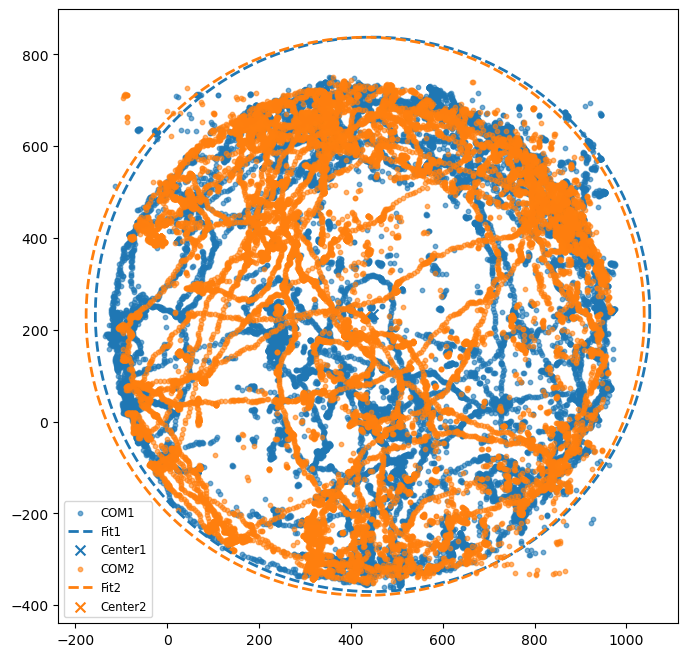

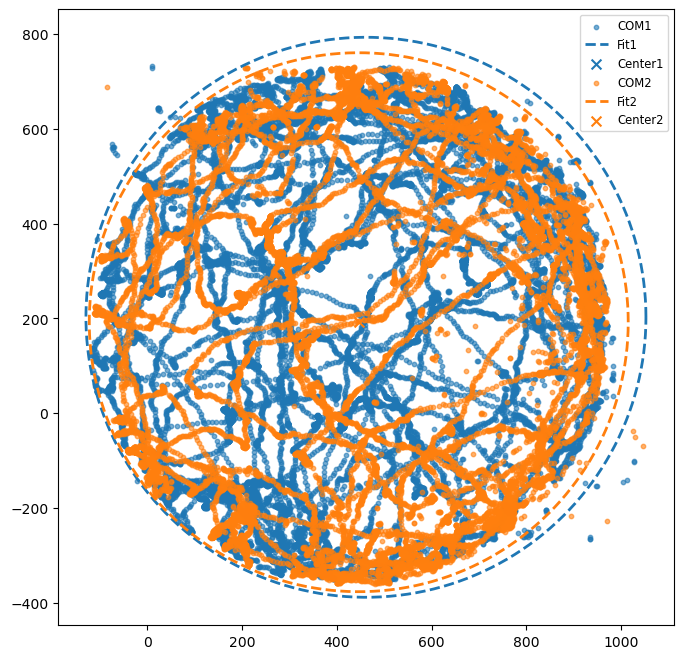

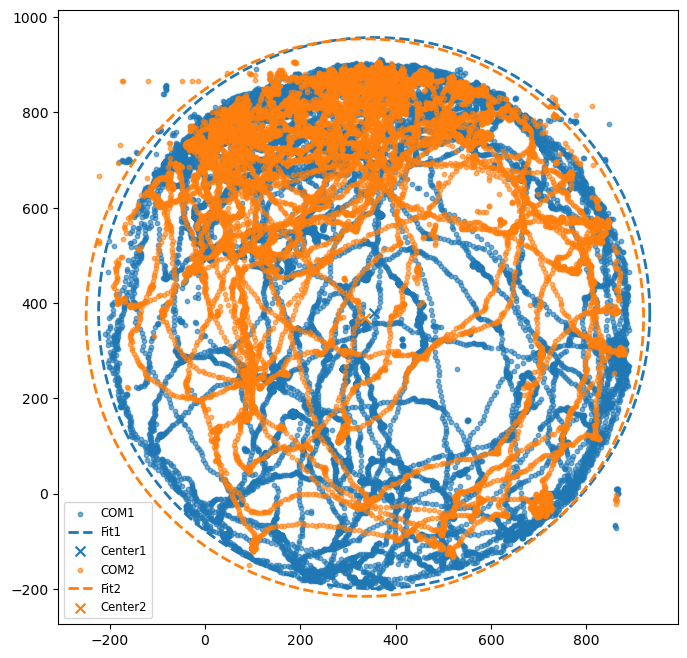

In [52]:
for p in session_paths:
    plot_com_circle_for_path_social(p)

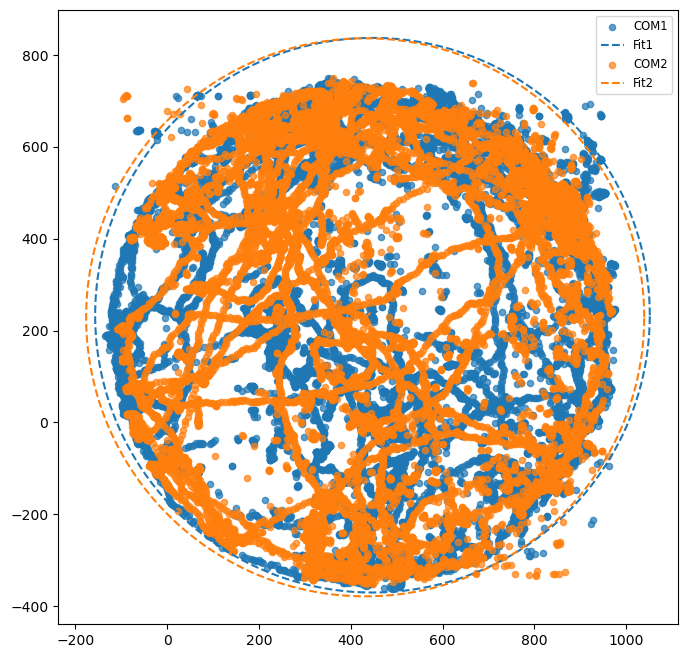

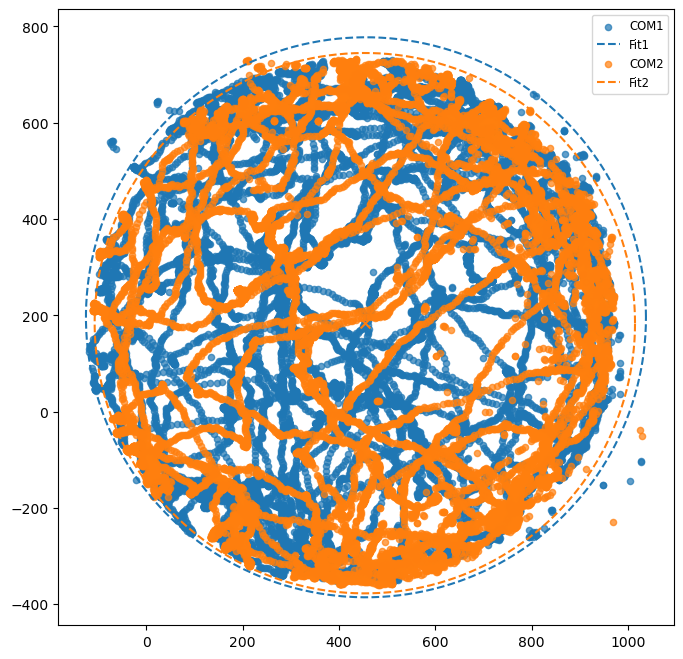

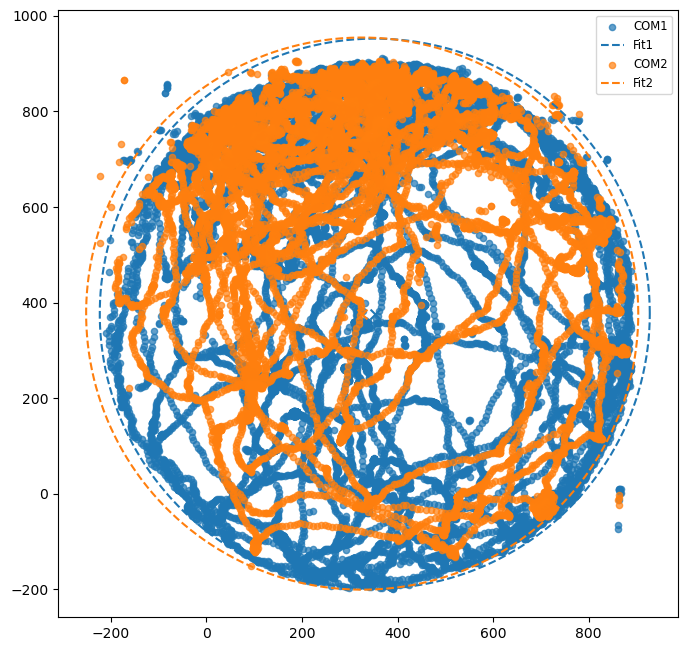

In [58]:
for p in session_paths:
    plot_com_scatter_discard(p)

plotting com_traga for /data/big_rim/rsync_dcc_sum/Oct3V1/2024_10_31/2social_mini_20240819V1r1_femalebleach_11_48/


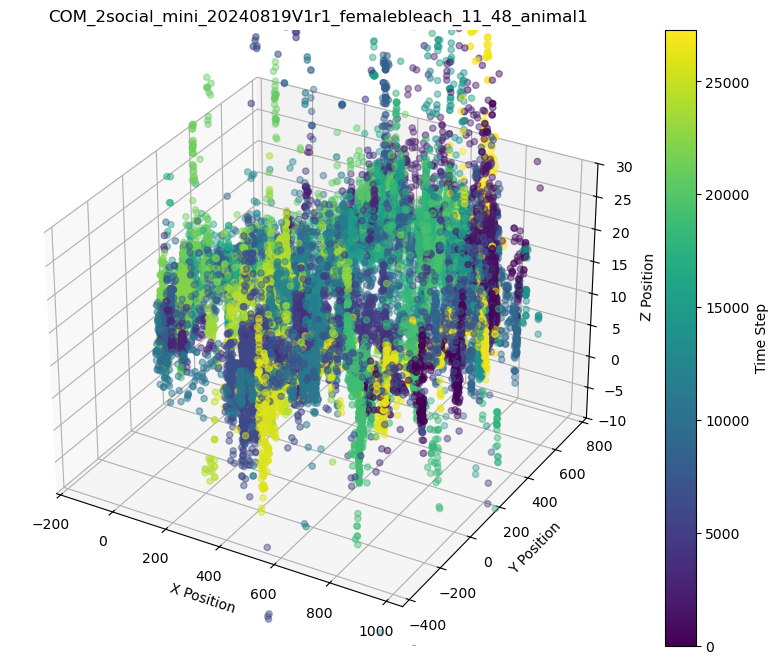

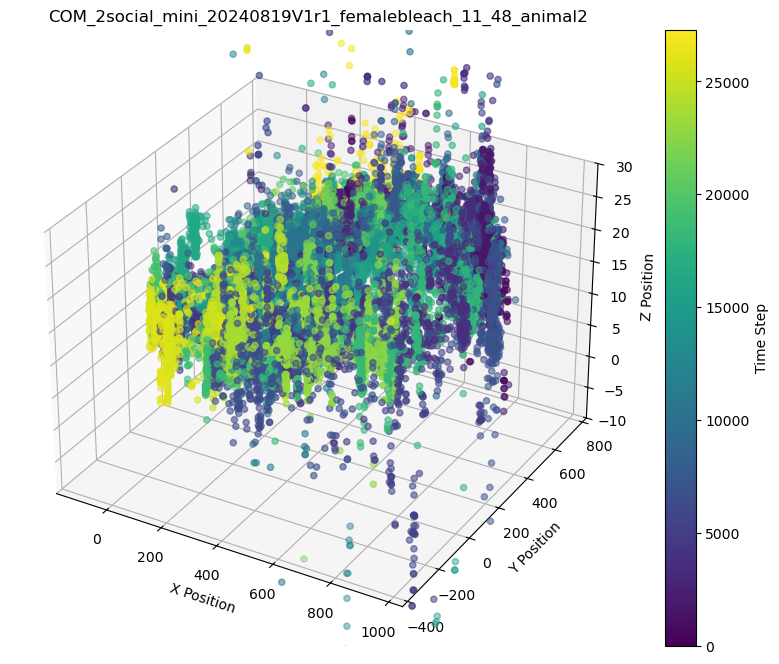

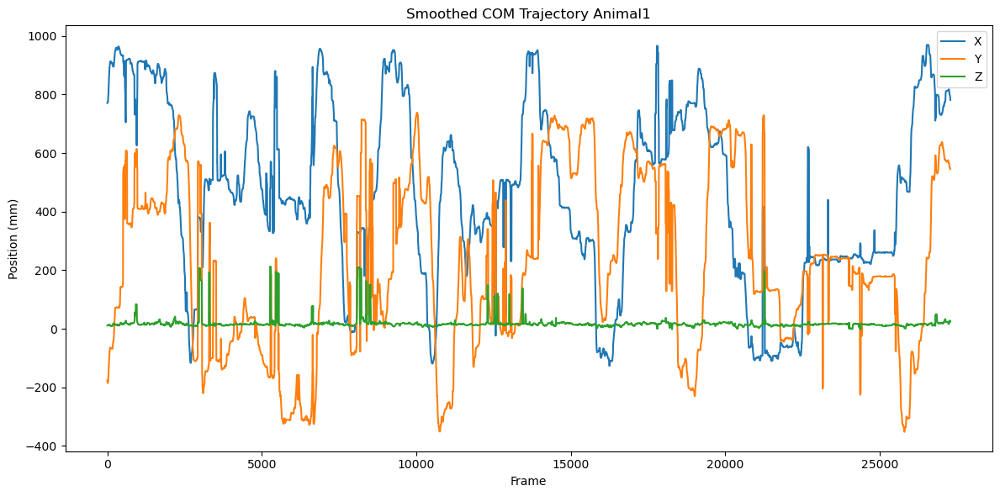

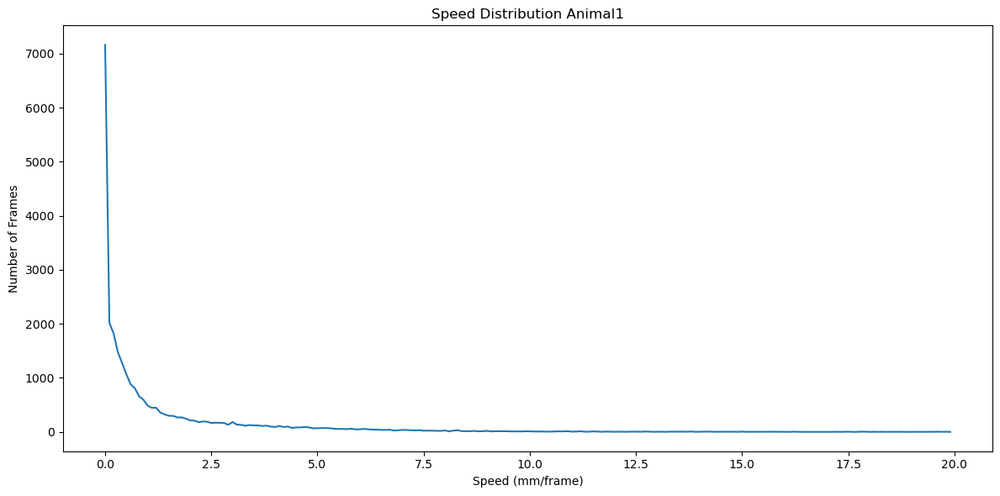

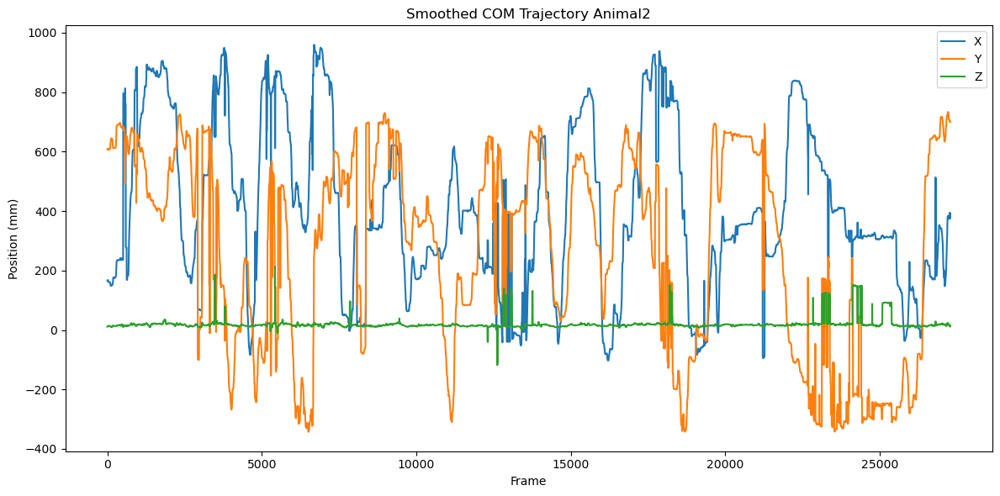

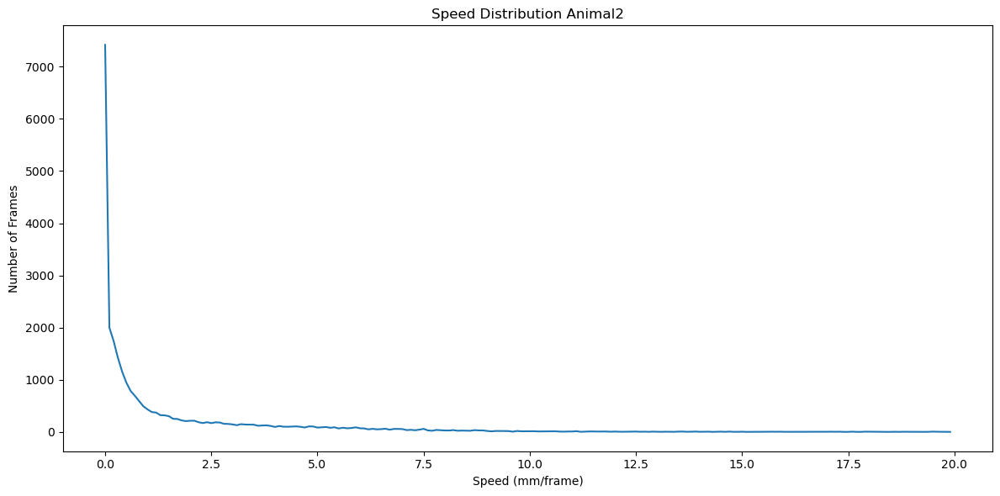

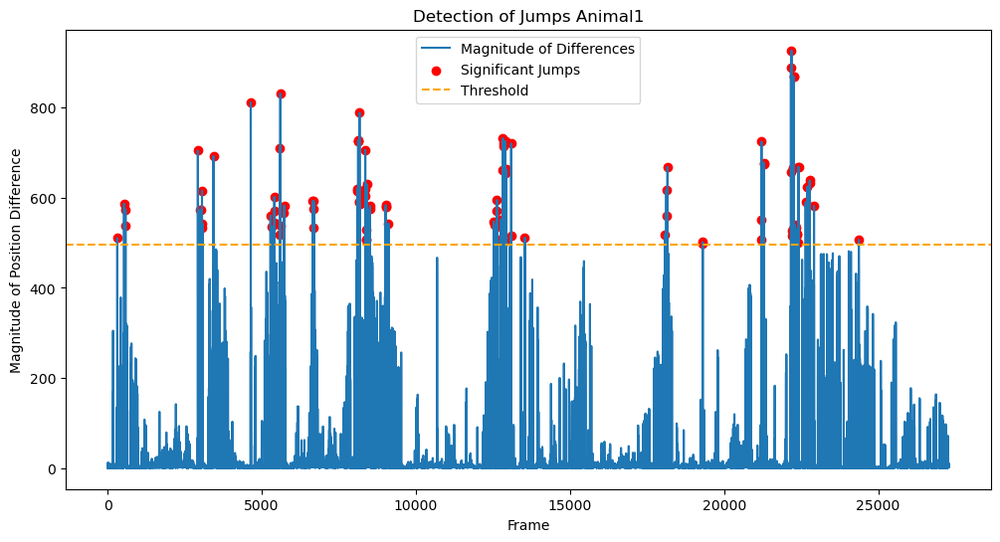

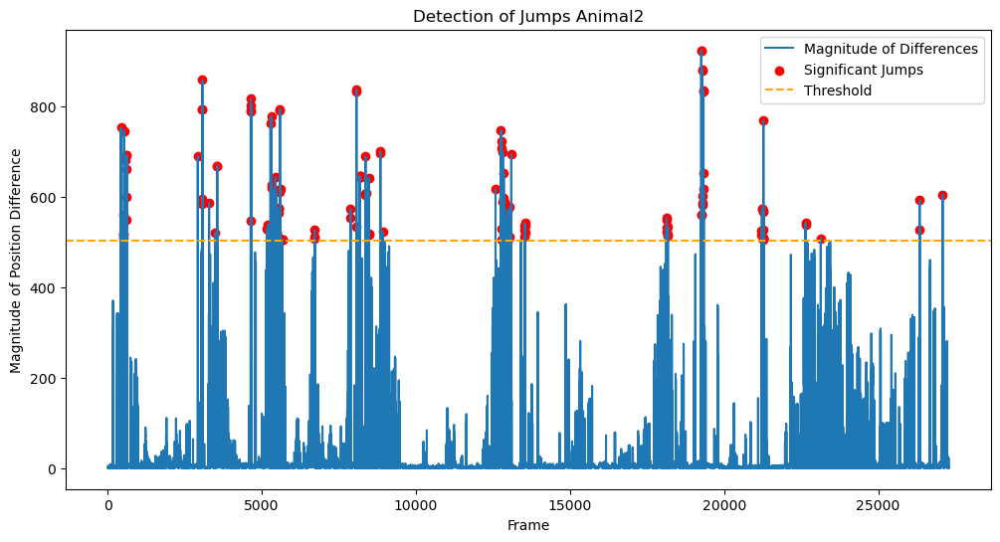

Frames with significant jumps per animal: {0: array([  312,   533,   581,   582,  2926,  3012,  3013,  3057,  3061,
        3076,  3434,  4642,  5282,  5332,  5407,  5414,  5415,  5580,
        5590,  5598,  5602,  5722,  5726,  6656,  6678,  6679,  6690,
        8101,  8104,  8123,  8124,  8125,  8127,  8155,  8156,  8157,
        8158,  8173,  8174,  8175,  8191,  8355,  8356,  8358,  8384,
        8392,  8394,  8409,  8505,  8513,  9023,  9024,  9025,  9112,
       12524, 12540, 12616, 12628, 12656, 12756, 12757, 12812, 12820,
       12843, 12851, 12852, 12861, 12891, 12894, 12895, 12902, 12913,
       12928, 12930, 13088, 13091, 13535, 18082, 18122, 18149, 18161,
       19305, 19306, 21208, 21210, 21213, 21289, 21290, 22163, 22165,
       22184, 22209, 22210, 22240, 22241, 22248, 22249, 22254, 22255,
       22285, 22289, 22290, 22309, 22317, 22378, 22379, 22384, 22411,
       22412, 22642, 22693, 22772, 22773, 22915, 24368]), 1: array([  431,   510,   520,   525,   526,   533,   57

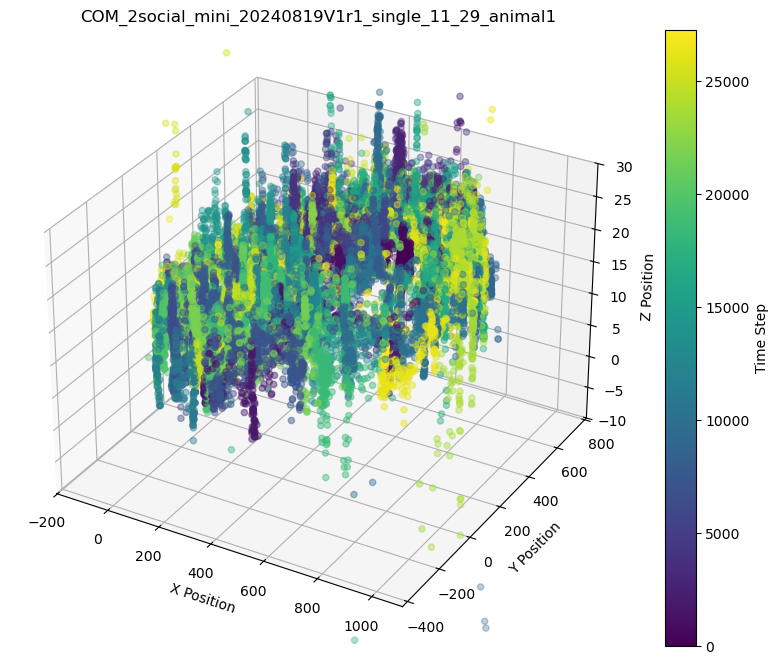

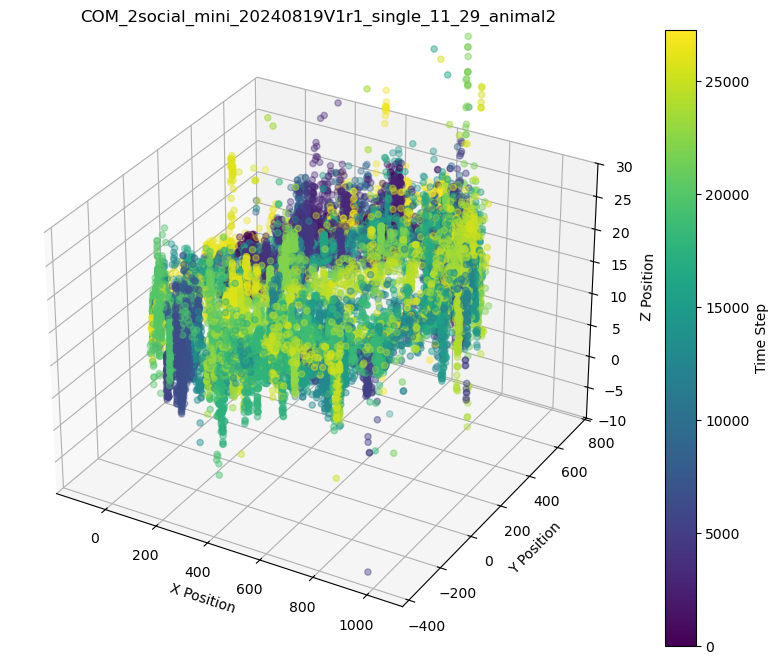

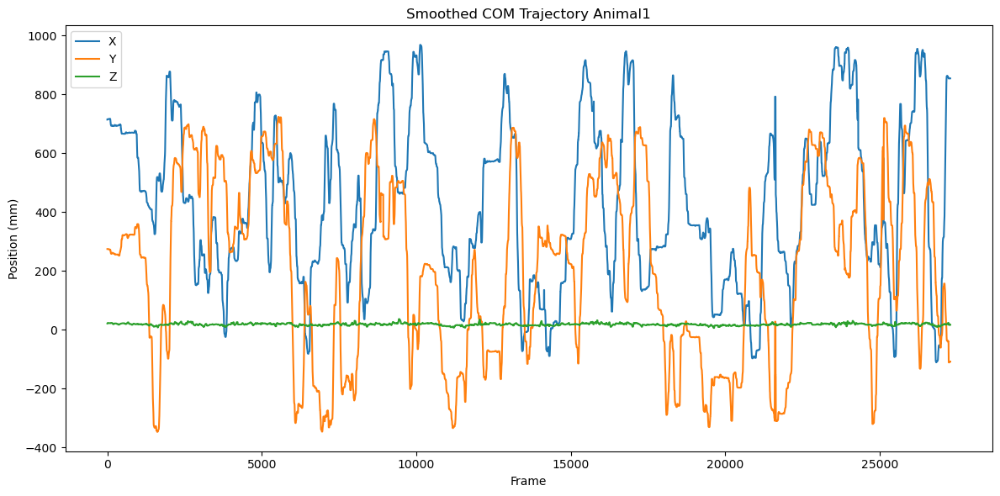

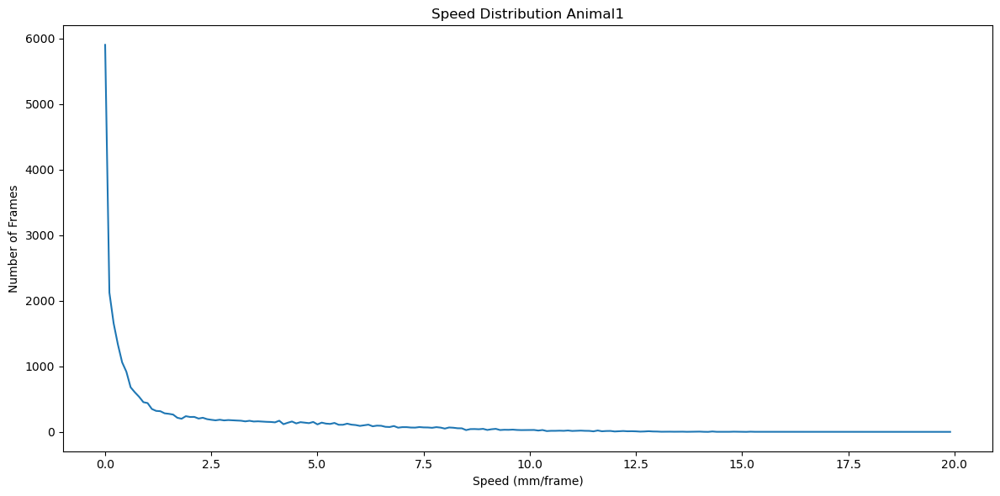

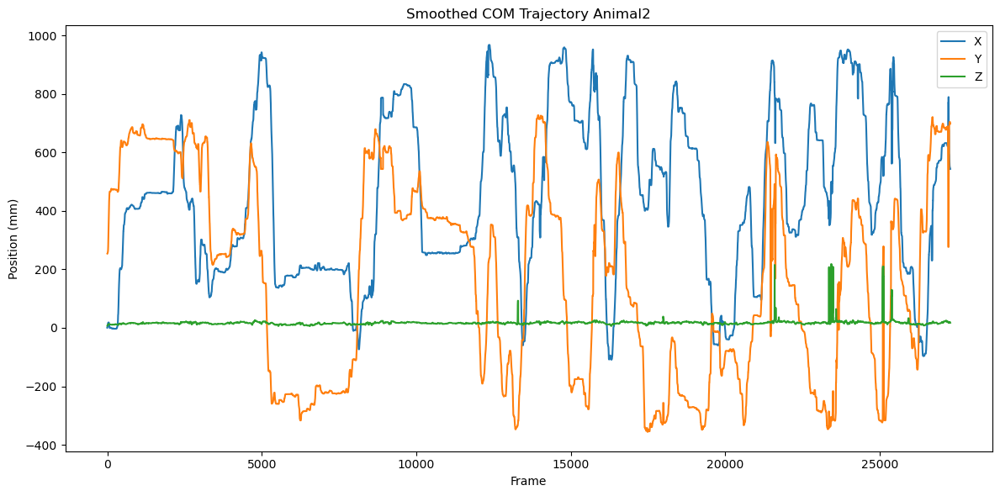

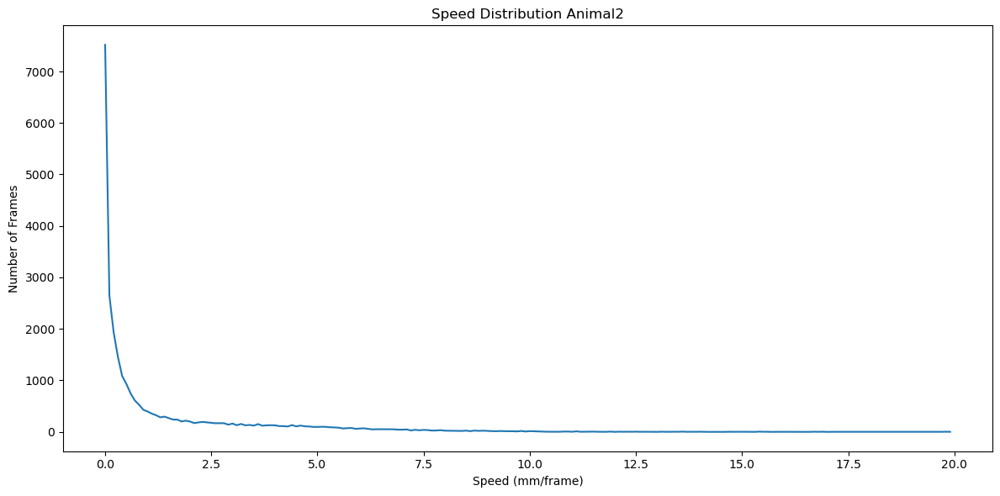

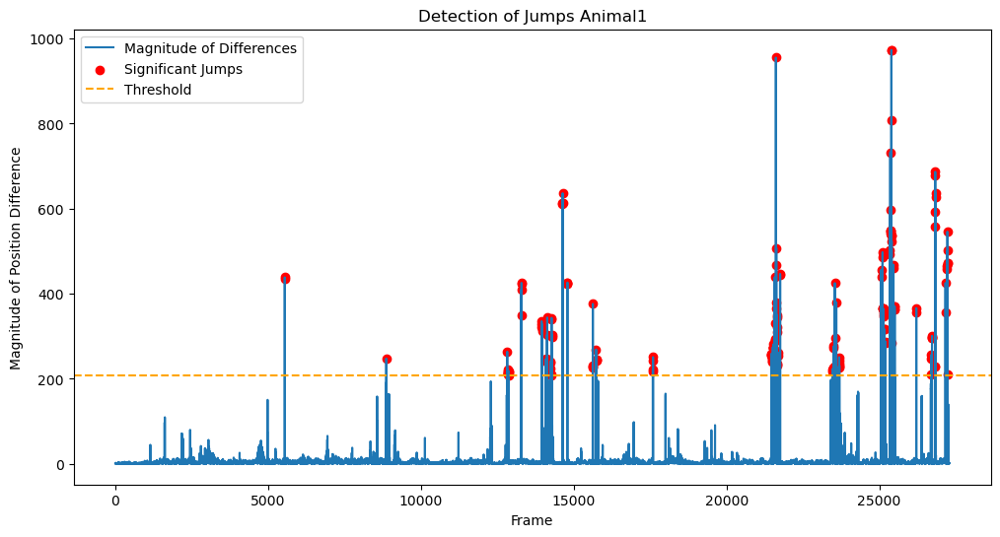

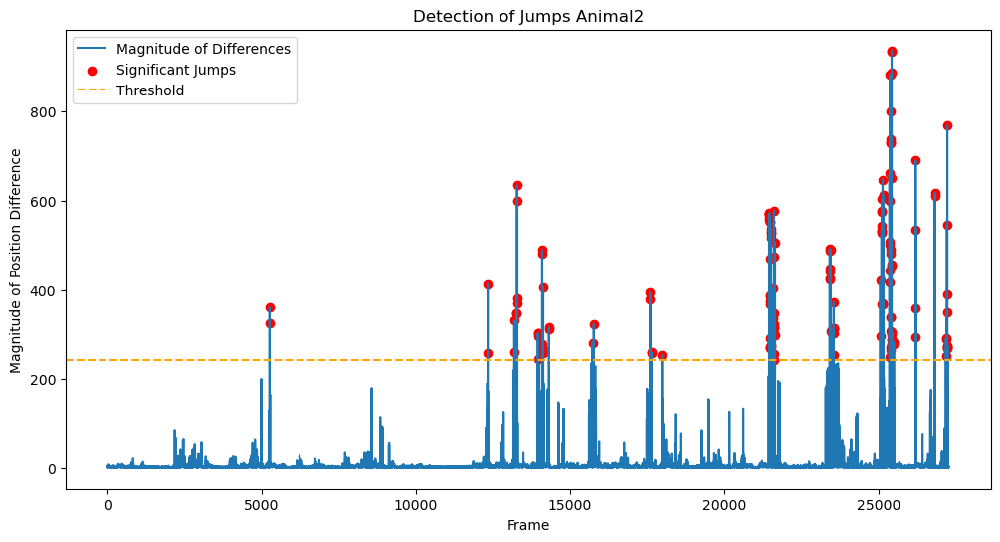

Frames with significant jumps per animal: {0: array([ 5538,  5541,  8863, 12822, 12835, 12844, 12848, 12850, 12852,
       12853, 12854, 12863, 12864, 12871, 12875, 13281, 13284, 13289,
       13290, 13948, 13950, 13954, 13959, 13960, 13962, 14090, 14094,
       14126, 14127, 14130, 14135, 14237, 14240, 14245, 14271, 14272,
       14274, 14275, 14282, 14283, 14620, 14624, 14636, 14639, 14789,
       14792, 14794, 14795, 15618, 15619, 15620, 15624, 15730, 15732,
       15736, 15737, 17586, 17587, 17591, 17594, 21464, 21465, 21475,
       21476, 21484, 21486, 21492, 21493, 21510, 21511, 21513, 21514,
       21532, 21533, 21575, 21577, 21578, 21595, 21596, 21597, 21598,
       21599, 21610, 21612, 21613, 21627, 21629, 21644, 21645, 21646,
       21647, 21649, 21652, 21653, 21687, 21688, 21751, 21753, 23473,
       23474, 23481, 23482, 23491, 23493, 23506, 23507, 23543, 23544,
       23568, 23571, 23575, 23576, 23592, 23642, 23681, 23682, 23684,
       23685, 23693, 23694, 25059, 25060, 25

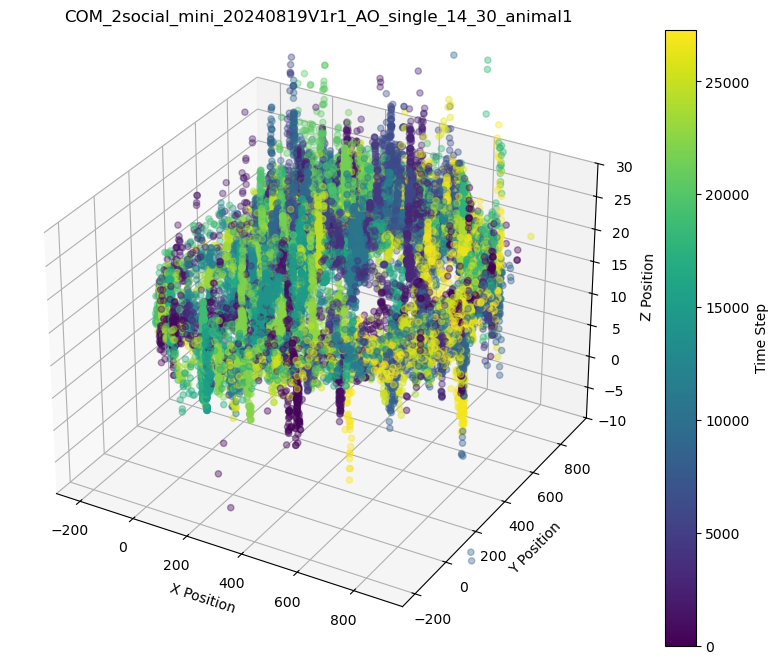

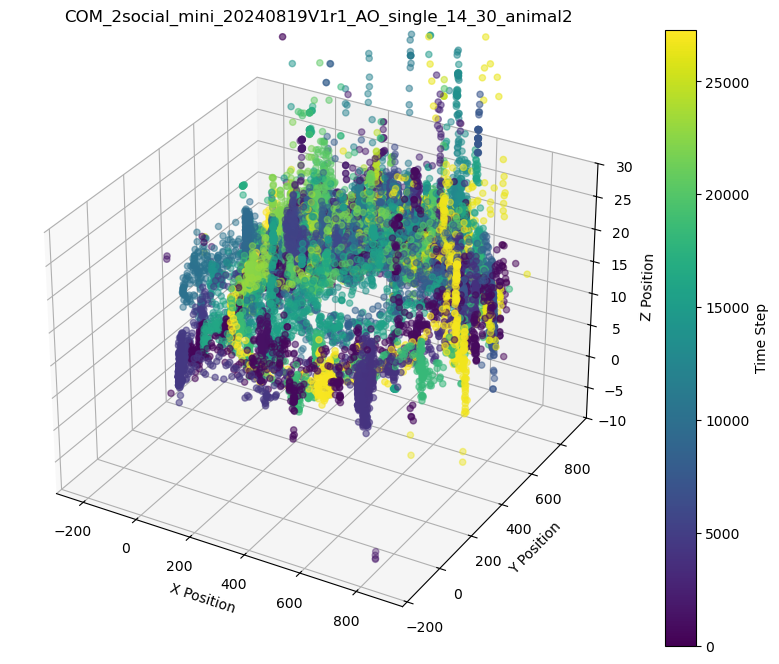

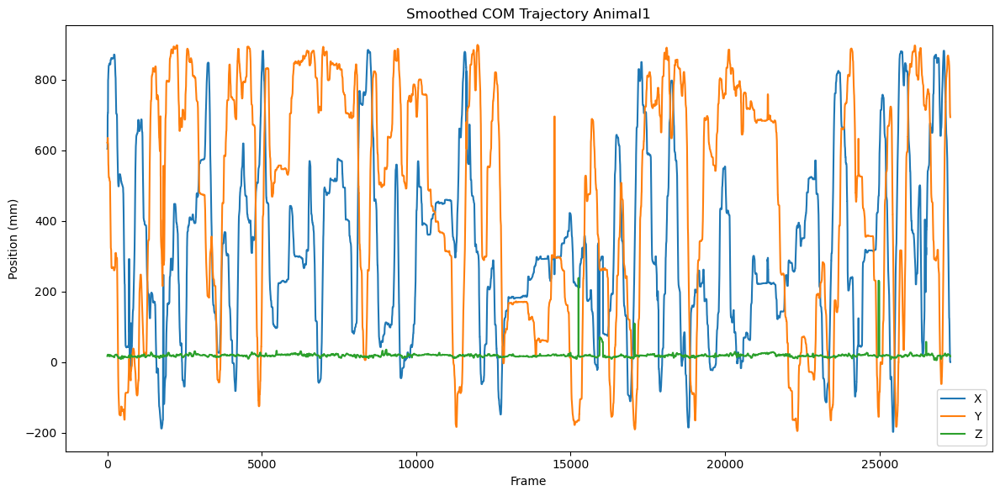

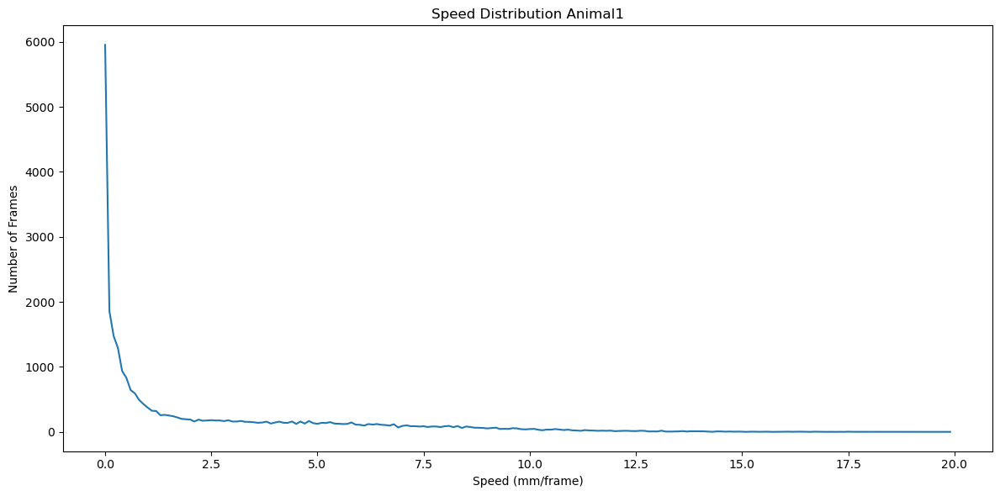

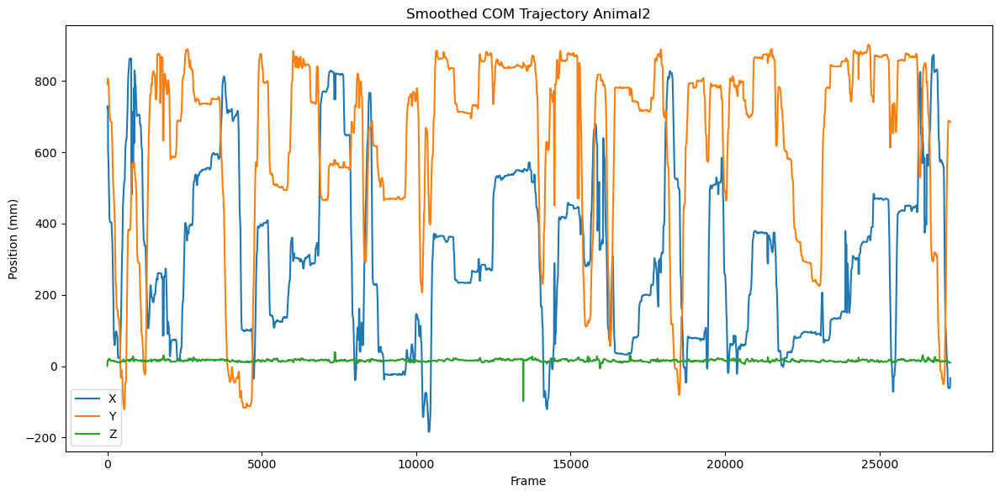

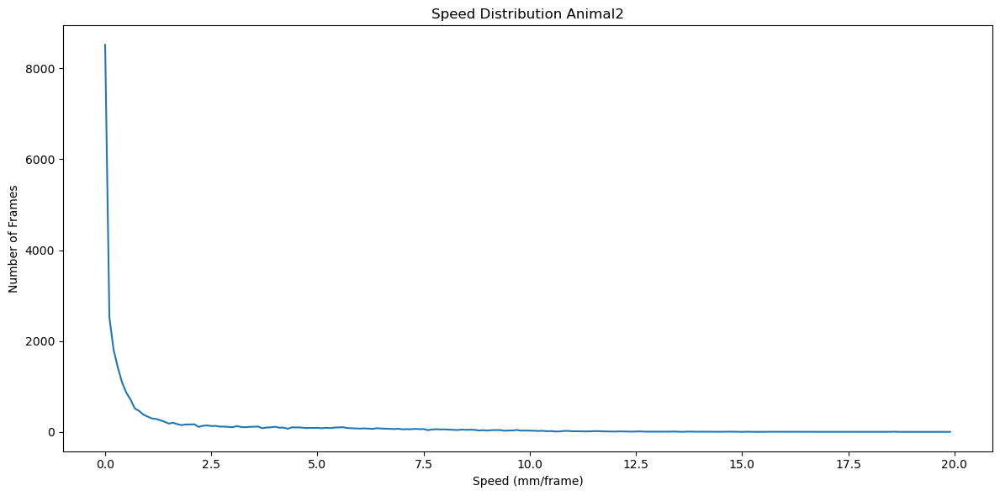

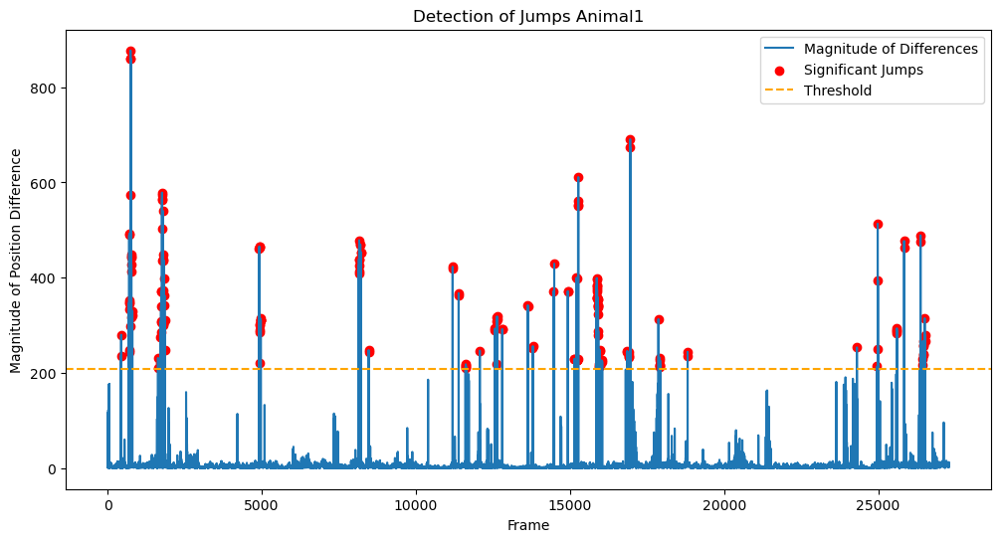

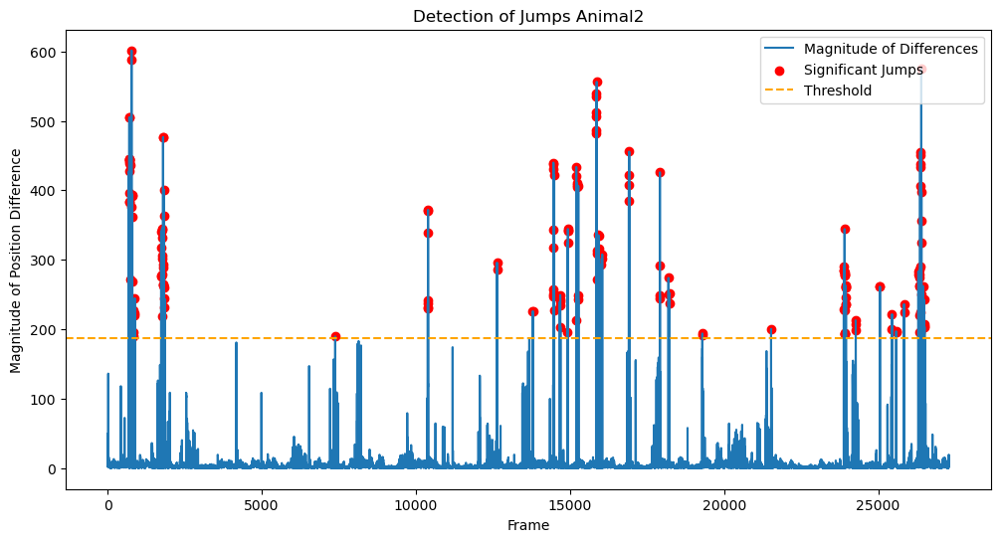

Frames with significant jumps per animal: {0: array([  435,   438,   692,   693,   698,   701,   702,   710,   711,
         713,   744,   746,   747,   751,   752,   763,   764,   768,
         771,   774,   778,   803,   804,  1633,  1634,  1698,  1699,
        1712,  1713,  1721,  1724,  1726,  1727,  1731,  1744,  1745,
        1763,  1764,  1769,  1770,  1782,  1784,  1797,  1798,  1802,
        1803,  1806,  1816,  1817,  1823,  1824,  1847,  1848,  1852,
        1857,  4914,  4919,  4920,  4921,  4927,  4929,  4935,  4939,
        4949,  4950,  4953,  4958,  4963,  4969,  8145,  8146,  8147,
        8152,  8154,  8160,  8194,  8196,  8221,  8222,  8469,  8470,
       11189, 11191, 11387, 11388, 11608, 11617, 11618, 11621, 11627,
       12074, 12565, 12566, 12615, 12617, 12618, 12633, 12636, 12799,
       12800, 13632, 13633, 13790, 13795, 14463, 14488, 14927, 14928,
       15142, 15143, 15214, 15215, 15223, 15227, 15233, 15234, 15239,
       15242, 15257, 15262, 15266, 15269, 15

In [56]:
import os
import sys
sys.path.append(os.path.abspath('../..'))

from utlis.vis_valid_utlis.scom_traga_utlis import plot_com_all_social

for p in session_paths:
    plot_com_all_social(p, perform_jump_indices=True)

In [ ]:

# # reprojections completely wrong. but even though, from this we noticed the animal actually close in 15mm. so that is good.

# import utlis.connectivity as connectivity
# from utlis.projection import *
# from utlis.sync_utlis.sync_df_utlis import find_calib_file
# import imageio

# def detect_close_com_and_make_overlays(
#     base_path,
#     com_folder_name='COM/predict00',
#     cam='Camera1',
#     threshold=None,
#     num_examples=5,
#     save_folder=None
# ):
#     """
#     Stand-alone: from base_path, load two-animal COM, detect 'close' frames,
#     and for the first num_examples output an overlay jpg of both COMs on the video.

#     Args:
#         base_path       (str): root of your recording (contains videos/, COM/, etc.)
#         com_folder_name (str): subfolder under base_path for COM .mat
#         cam             (str): which camera key to use for projection
#         threshold       (float|None):
#             cutoff distance (same units as COM coords);
#             if None → defaults to mean(dist) - std(dist)
#         num_examples    (int): how many overlay images to write
#         save_folder     (str|None):
#             where to dump overlays; if None, uses base_path/COM/predict00/overlays

#     Returns:
#         np.ndarray of all frame indices where COM distance < threshold
#     """
#     # 1) locate and load COM
#     com_mat = os.path.join(base_path, com_folder_name, 'com3d0.mat')
#     if not os.path.isfile(com_mat):
#         raise FileNotFoundError(f"COM file not found: {com_mat}")
#     raw = sio.loadmat(com_mat).get('com')
#     # reshape to (n_frames, 3, n_animals)
#     if raw.ndim == 3 and raw.shape[1] == 3:
#         com_data = raw
#     elif raw.ndim == 2 and raw.shape[1] % 3 == 0:
#         n_animals = raw.shape[1] // 3
#         com_data  = raw.reshape(-1, 3, n_animals)
#     else:
#         raise ValueError(f"Unexpected COM shape {raw.shape}")
#     if com_data.shape[2] != 2:
#         raise ValueError(f"Expected exactly 2 animals, got {com_data.shape[2]}")

#     # 2) compute distances
#     diffs = com_data[:,:,0] - com_data[:,:,1]           # (n_frames,3)
#     dists = np.linalg.norm(diffs, axis=1)               # (n_frames,)
#     if threshold is None:
#         threshold = dists.mean() - dists.std()
#     close_idxs = np.where(dists < threshold)[0]
#     print(f"[detect_close_com] threshold={threshold:.2f}, {len(close_idxs)} frames → {close_idxs}")

#     # 3) prepare output folder
#     if save_folder is None:
#         save_folder = os.path.join(base_path, com_folder_name, 'overlays')
#     os.makedirs(save_folder, exist_ok=True)

#     # 4) load camera calibration & video
#     calib = find_calib_file(base_path)
#     cams  = load_cameras(calib)
#     vid_path = os.path.join(base_path, f'videos/{cam}/0.mp4')
#     reader   = imageio.get_reader(vid_path)

#     # 5) for each example, project and overlay
#     for i, frame_idx in enumerate(close_idxs[:num_examples]):
#         pts3d = np.vstack([ 
#             com_data[frame_idx, :, 0],
#             com_data[frame_idx, :, 1]
#         ])  # shape (2,3)
#         pts2d = project_to_2d(pts3d, cams[cam]["K"], cams[cam]["r"], cams[cam]["t"])[:,:2]
#         pts2d = distortPoints(
#             pts2d, cams[cam]["K"],
#             np.squeeze(cams[cam]["RDistort"]),
#             np.squeeze(cams[cam]["TDistort"])
#         )

#         frame = reader.get_data(frame_idx)
#         plt.figure(figsize=(6,6))
#         plt.imshow(frame)
#         plt.scatter(pts2d[0,0], pts2d[0,1], s=60, marker='o', label='Animal 1', edgecolor='w')
#         plt.scatter(pts2d[1,0], pts2d[1,1], s=60, marker='o', label='Animal 2', edgecolor='k')
#         plt.axis('off')
#         plt.legend(loc='lower right')
#         out_file = os.path.join(
#             save_folder,
#             f'close_{frame_idx:04d}_overlay.jpg'
#         )
#         plt.tight_layout()
#         plt.savefig(out_file, dpi=150)
#         plt.close()

#     return close_idxs

# paaa = "/data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240819V1r1_AO_single_14_30/"
# close_frames = detect_close_com_and_make_overlays(paaa, threshold=15.0)

[detect_close_com] threshold=15.00, 455 frames → [ 1062  1063  1432  1433  1455  1456  1457  1459  1460  1461  1462  1463
  1464  1465  1466  1467  1468  1469  1470  1474  1477  1484  1485  1486
  1487  1488  1489  1490  1491  1492  1493  1494  1495  1496  1497  1498
  1499  1500  1501  1502  1503  1504  1505  1507  1510  1511  1542  1543
  1544  1969  1970  1971  1972  1973  2010  2358  2362  2363  2364  2366
  2370  2371  2372  2373  2374  2375  2377  2378  2380  2388  2584  2592
  2594  2598  2601  2603  2605  2606  2607  2608  2610  2628  2629  2630
  2631  2632  2633  2638  2639  2640  2641  2642  2643  2644  2645  2646
  2652  2656  2660  2689  2690  2692  2701  2711  2725  2742  2747  2748
  2749  2751  2752  2760  2761  2765  2770  2774  2891  2892  5376  5377
  5378  5379  5380  5381  5382  5383  5384  5385  5386  5387  5388  5389
  5392  5393  5394  5395  5396  5397  5398  5399  5400  5401  5402  5403
  5406  5408  5409  5410  5411  5412  5413  5414  5415  5416  5417  5418
  

In [62]:
import os
import numpy as np
import scipy.io as sio
import imageio

def detect_and_save_close_frames(
    base_path,
    com_folder_name='COM/predict00',
    cam='Camera1',
    threshold=None,
    num_examples=3,
    save_folder=None,
):
    """
    1) Load 2-animal COM (.mat)
    2) Compute per-frame distance → close_idxs
    3) Save only the first `num_examples` close frames as JPEG
    4) Save those indices as a .npy file
    """
    # 1) load & reshape COM
    com_mat = os.path.join(base_path, com_folder_name, 'com3d0.mat')
    raw = sio.loadmat(com_mat).get('com')
    if raw.ndim == 3 and raw.shape[1] == 3:
        com = raw
    else:
        n_animals = raw.shape[1] // 3
        com = raw.reshape(-1, 3, n_animals)
    if com.shape[2] != 2:
        raise ValueError(f"Expected 2 animals, got {com.shape[2]}")

    # 2) compute distances
    diffs = com[:, :, 0] - com[:, :, 1]
    dists = np.linalg.norm(diffs, axis=1)
    if threshold is None:
        threshold = dists.mean() - dists.std()
    close_idxs = np.where(dists < threshold)[0]
    print(f"[detect_close] threshold={threshold:.2f}, found {len(close_idxs)} frames")

    # 3) prepare output
    if save_folder is None:
        save_folder = os.path.join(base_path, com_folder_name, 'close_frames')
    os.makedirs(save_folder, exist_ok=True)

    reader = imageio.get_reader(os.path.join(base_path, f'videos/{cam}/0.mp4'))

    to_save = close_idxs[:num_examples]
    for idx in to_save:
        frame = reader.get_data(idx)
        out_path = os.path.join(save_folder, f'frame_{idx:05d}.jpg')
        imageio.imwrite(out_path, frame)

    # 4) save just those indices
    indices_path = os.path.join(save_folder, 'example_frame_indices.npy')
    np.save(indices_path, to_save)

    print(f"Saved {len(to_save)} example frames to '{save_folder}' and indices to '{indices_path}'")
    return close_idxs

# example usage
base = "/data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240819V1r1_AO_single_14_30"
close_frames = detect_and_save_close_frames(base, threshold=15.0, num_examples=3)


[detect_close] threshold=15.00, found 455 frames
Saved 3 example frames to '/data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240819V1r1_AO_single_14_30/COM/predict00/close_frames' and indices to '/data/big_rim/rsync_dcc_sum/Oct3V1/2024_11_01/2social_mini_20240819V1r1_AO_single_14_30/COM/predict00/close_frames/example_frame_indices.npy'
